# HR Analytics Project

Loading needed libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

# CHECKING DATA ROWS AND COLUMNS

In [2]:
df=pd.read_csv("HR.csv")

In [3]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [4]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [5]:
df.tail()


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [6]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


SOME COLUMNS HAVE MEAN>MEDIAN VALUE(50%)LIKE EMPLOYEE NUMBER,TOTAL WORKING YEARS,
YEARS AT COMPANY,YEARS SINCE LAST PROMOTION,YEARS WITH CURR MANAGER SO SKEWNESS IS PRESENT THERE

YEARS AT COMPANY ,YEARS IN CURRENT ROLE,YEARS SINCE LAST PROMOTION,YEARS WIYH CURRENT MANAGER,EMPLOYEE NUMBER
THESE COLUMNS HAVE HIGH VARIANCE BETWEEN 75% AND MAX,SO OUTLIER PRESENCE IS THERE 

COLUMNS WITH HIGH STD DEVIATION LIKE,DAILY RATE,EMPLOYEE NUMBER,HOURLY RATE HAVE HIGH DATA SPREAD

In [7]:
df.shape

(1470, 35)

DATASET HAS1470 ROWS AND 35 COLUMNS

In [8]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

DIFFERENT COLUMNS IN THE DATASET ARE Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount','EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating','RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager

In [9]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

COLUMNS HAVE OBJECT AND INT DATATYPES

In [10]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

THERE IS NO NULL VARIABLE IN OUR DATASET COLUMNS

<AxesSubplot:>

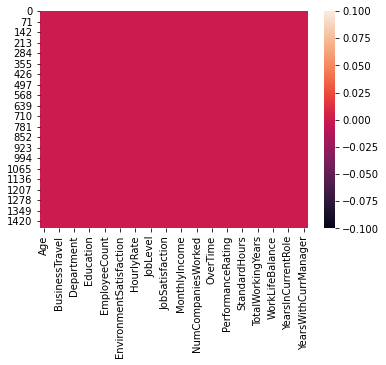

In [11]:
sns.heatmap(df.isnull())

PLOT CLEARLY SHOWS THE ABSENCE OF NULL VARIABLES

# EDA

# ANALYSING TARGET VARIABLE

In [12]:
df['Attrition']

0       Yes
1        No
2       Yes
3        No
4        No
       ... 
1465     No
1466     No
1467     No
1468     No
1469     No
Name: Attrition, Length: 1470, dtype: object

In [13]:
df['Attrition'].unique()

array(['Yes', 'No'], dtype=object)

No     1233
Yes     237
Name: Attrition, dtype: int64


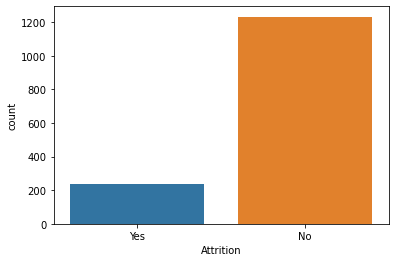

In [14]:
sns.countplot(df['Attrition'])
print(df["Attrition"].value_counts())

target has unbanced class:-no has 1233 counts and yes has 237 counts

In [15]:
Attrition_count = df.groupby('Attrition')['Attrition'].count()

([<matplotlib.patches.Wedge at 0x7fea910447c0>,
 [Text(-0.9618916732177651, 0.5336332157899546, '0'),
  Text(0.961891673217765, -0.5336332157899547, '1')])

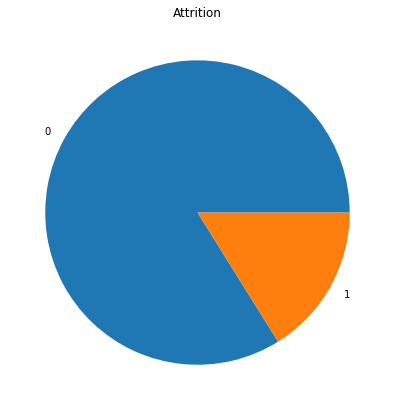

In [16]:
plt.figure(figsize=(7,7))
plt.title("Attrition")
plt.pie(Attrition_count.values, labels=[0, 1])

From the pie chart it is clear that more than 75% of count is no

we have to balance this imbalance class datas

# FEATURE COLUMNS:UNIVARIATE ANALYSIS

COUNT PLOTs

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


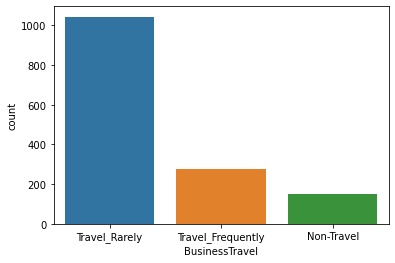

In [17]:
sns.countplot(df['BusinessTravel'])
print(df["BusinessTravel"].value_counts())

IN BusinessTravel class travel rarely is highest count,non travel has least count

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


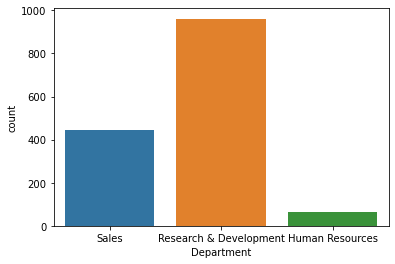

In [18]:
sns.countplot(df['Department'])
print(df["Department"].value_counts())

there are three different departments,research and development has high count

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


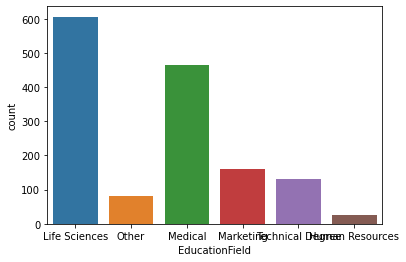

In [19]:
sns.countplot(df['EducationField'])
print(df["EducationField"].value_counts())

employers are from 6 different depts,most of them are from life science,least number cound from HR

Male      882
Female    588
Name: Gender, dtype: int64


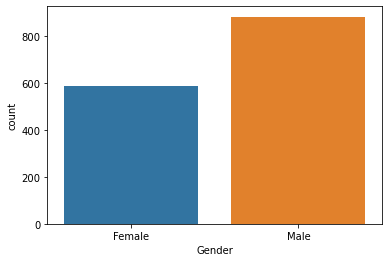

In [20]:
sns.countplot(df['Gender'])
print(df["Gender"].value_counts())

IN CASE OF GENDER MALE COUNT IS GREATER WHEN COMPARING FEMALE

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64


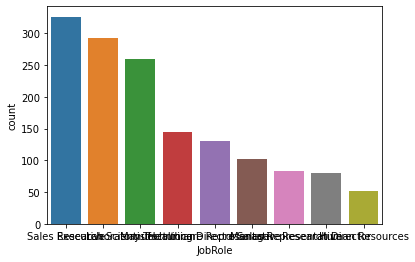

In [21]:
sns.countplot(df['JobRole'])
print(df["JobRole"].value_counts())

9 DIFFERENT JOB ROLES ARE THERE ,Sales Executive IS HIGH IN NUMBER COUNT

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64


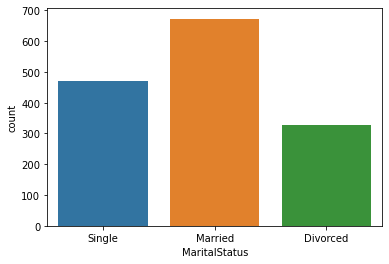

In [22]:
sns.countplot(df['MaritalStatus'])
print(df["MaritalStatus"].value_counts())

MARRIED PEOPLE ARE MORE IN WORK(673),UNMARRIED PERSONS ARE470 IN COUNT AND 327 DIVORCEES ARE THERE

all workers are over 18 category

No     1054
Yes     416
Name: OverTime, dtype: int64


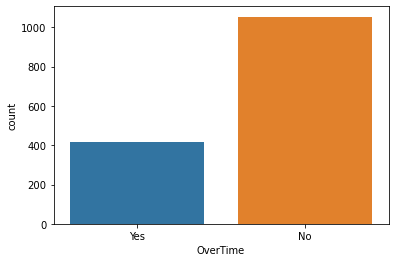

In [24]:
sns.countplot(df['OverTime'])
print(df["OverTime"].value_counts())

less number of people prefering overtime,1054 person in 1470 count not opting it

3    893
2    344
4    153
1     80
Name: WorkLifeBalance, dtype: int64


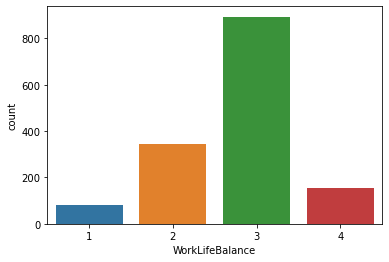

In [25]:
sns.countplot(df['WorkLifeBalance'])
print(df["WorkLifeBalance"].value_counts())

worklife balance have 4 different count

2    547
3    491
4    123
5    119
1     71
6     65
0     54
Name: TrainingTimesLastYear, dtype: int64


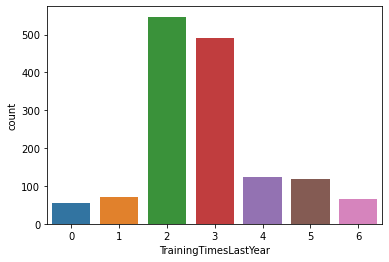

In [26]:
sns.countplot(df['TrainingTimesLastYear'])
print(df["TrainingTimesLastYear"].value_counts())

analysingb training time,2 times has greater count and nil and 6 times have least count values

0    631
1    596
2    158
3     85
Name: StockOptionLevel, dtype: int64


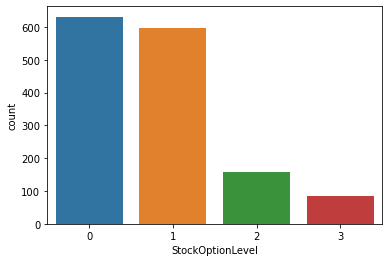

In [27]:
sns.countplot(df['StockOptionLevel'])
print(df['StockOptionLevel'].value_counts())

tere are four stock option lavel are there,null is in peak count

3    893
2    344
4    153
1     80
Name: WorkLifeBalance, dtype: int64


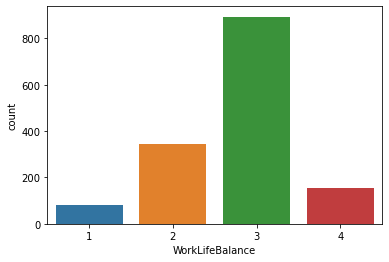

In [28]:
sns.countplot(df['WorkLifeBalance'])
print(df['WorkLifeBalance'].value_counts())

above plot shows the count plot for worklifebalance

3    868
2    375
4    144
1     83
Name: JobInvolvement, dtype: int64


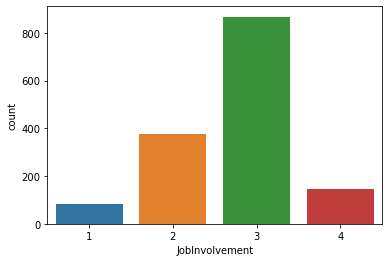

In [29]:
sns.countplot(df['JobInvolvement'])
print(df['JobInvolvement'].value_counts())

analysing job involvement it is clear that 3 has higher count

# DISTRIBUTION PLOT FOR INT DTYPES

<AxesSubplot:xlabel='Age', ylabel='Density'>

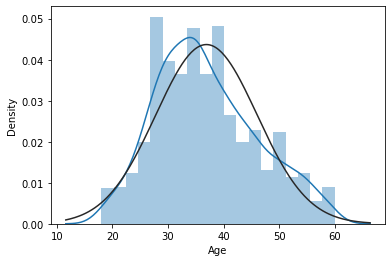

In [30]:
sns.distplot(df['Age'],fit=norm)

age column datas are almost equally distributed,so there is less chance of skewness

<AxesSubplot:xlabel='DailyRate', ylabel='Density'>

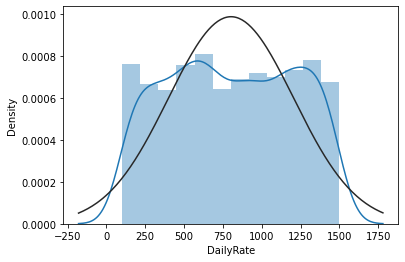

In [31]:
sns.distplot(df['DailyRate'],fit=norm)

DailyRate is not distributed normally

<AxesSubplot:xlabel='DistanceFromHome', ylabel='Density'>

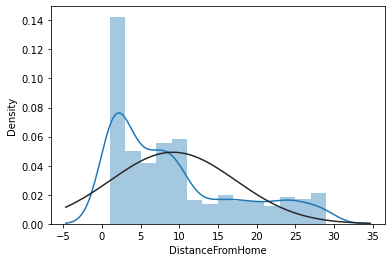

In [32]:
sns.distplot(df['DistanceFromHome'],fit=norm)

DistanceFromHome column have negative skewness

<AxesSubplot:xlabel='EmployeeNumber', ylabel='Density'>

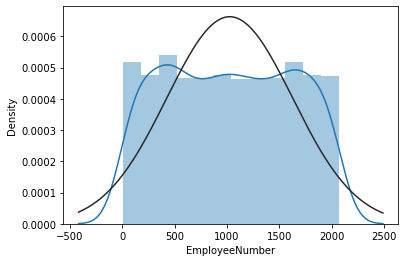

In [33]:
sns.distplot(df['EmployeeNumber'],fit=norm)

Employee number is not distributed normally

<AxesSubplot:xlabel='HourlyRate', ylabel='Density'>

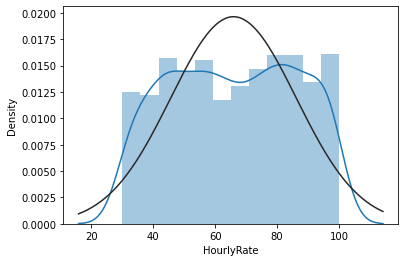

In [34]:
sns.distplot(df['HourlyRate'],fit=norm)

In [35]:
HourlyRate also not in normal distribution

SyntaxError: invalid syntax (<ipython-input-35-b353a7904500>, line 1)

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Density'>

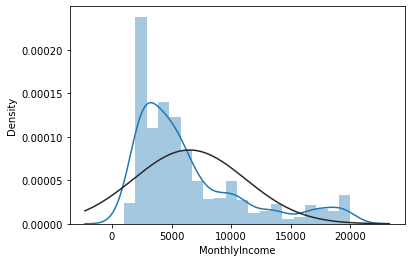

In [36]:
sns.distplot(df['MonthlyIncome'],fit=norm)

monthly income data is not normally distributed

<AxesSubplot:xlabel='MonthlyRate', ylabel='Density'>

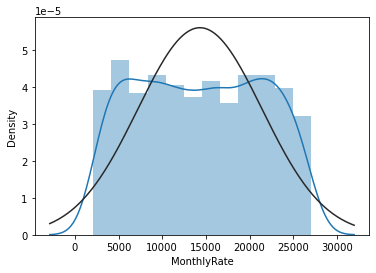

In [37]:
sns.distplot(df['MonthlyRate'],fit=norm)

MonthlyRate column distribution shown in above figure

<AxesSubplot:xlabel='PercentSalaryHike', ylabel='Density'>

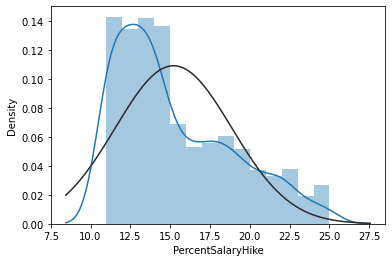

In [38]:
sns.distplot(df['PercentSalaryHike'],fit=norm)

PercentSalaryHike has clear skewness presence,it is notb distributed normally

<AxesSubplot:xlabel='YearsWithCurrManager', ylabel='Density'>

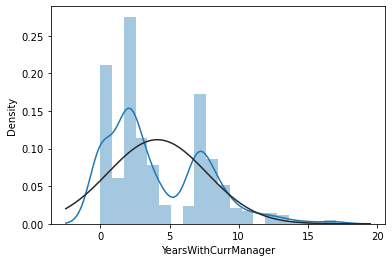

In [39]:
sns.distplot(df['YearsWithCurrManager'],fit=norm)

years with current manager not normally distributed

<AxesSubplot:xlabel='YearsAtCompany', ylabel='Density'>

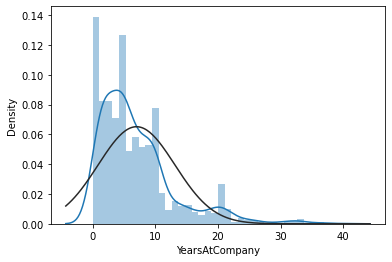

In [40]:
sns.distplot(df['YearsAtCompany'],fit=norm)

skewness is present in YearsAtCompany column

# bivariate analysis

<AxesSubplot:title={'center':'comparison of hourley rate and income'}, xlabel='HourlyRate', ylabel='MonthlyIncome'>

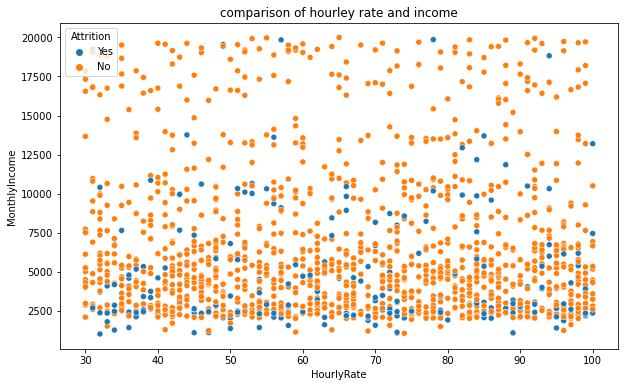

In [41]:
plt.figure(figsize=[10,6])
plt.title('comparison of hourley rate and income')
sns.scatterplot(df['HourlyRate'],df['MonthlyIncome'],hue=df['Attrition'])

from the figure it is clear that attrition is more in lower income level more over monthly income is not increasing directly propotional to hourley rate

<AxesSubplot:title={'center':'comparison of job imvolvement and satisfaction'}, xlabel='JobInvolvement', ylabel='JobSatisfaction'>

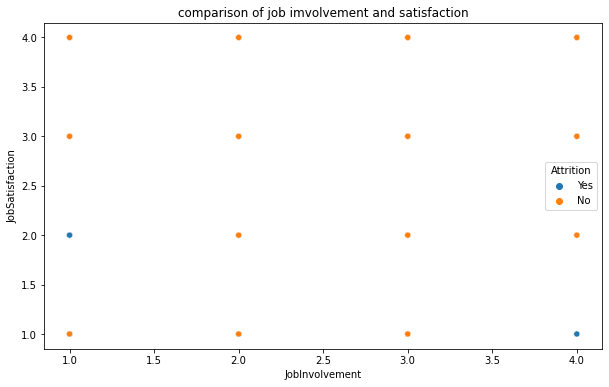

In [42]:
plt.figure(figsize=[10,6])
plt.title('comparison of job imvolvement and satisfaction')
sns.scatterplot(df['JobInvolvement'],df['JobSatisfaction'],hue=df['Attrition'])

from plot it is clear that there is no linear relation among job involvement and satisfaction

<AxesSubplot:title={'center':'comparison department and education field'}, xlabel='Department', ylabel='EducationField'>

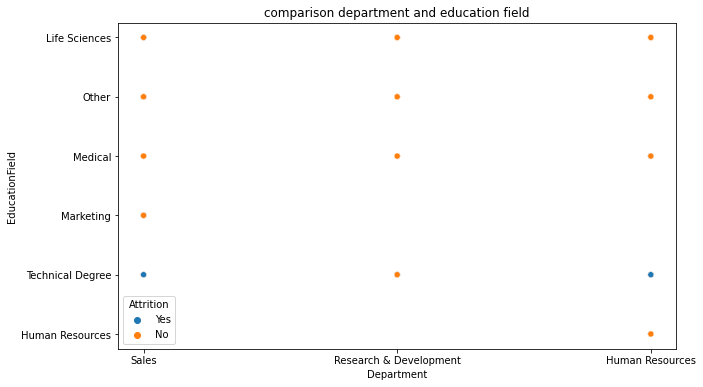

In [43]:
plt.figure(figsize=[10,6])
plt.title('comparison department and education field')
sns.scatterplot(df['Department'],df['EducationField'],hue=df['Attrition'])

independent to education field people working in all department

<AxesSubplot:title={'center':'comparison of age and monthly income'}, xlabel='Age', ylabel='MonthlyIncome'>

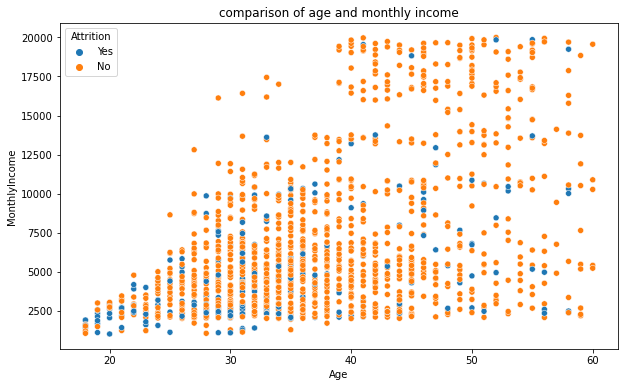

In [44]:
plt.figure(figsize=[10,6])
plt.title('comparison of age and monthly income')
sns.scatterplot(df['Age'],df['MonthlyIncome'],hue=df['Attrition'])

age and monthly income has almost linear relation and the attrition rate is less in high salary and age area

<AxesSubplot:title={'center':'comparison of joblevel and monthly income'}, xlabel='JobLevel', ylabel='MonthlyIncome'>

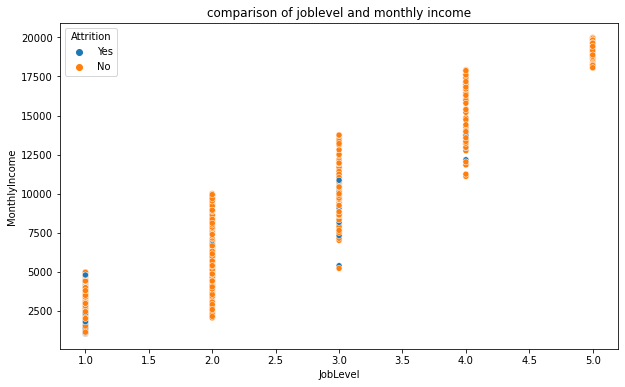

In [45]:
plt.figure(figsize=[10,6])
plt.title('comparison of joblevel and monthly income')
sns.scatterplot(df['JobLevel'],df['MonthlyIncome'],hue=df['Attrition'])

JOB LEVEL IS HEAVILY RELATED TO MONTHLY INCOME

<AxesSubplot:title={'center':'comparison of joblevel and monthly income'}, xlabel='BusinessTravel', ylabel='WorkLifeBalance'>

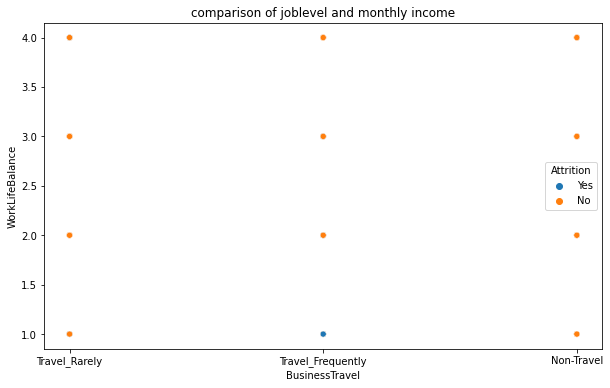

In [46]:
plt.figure(figsize=[10,6])
plt.title('comparison of joblevel and monthly income')
sns.scatterplot(df['BusinessTravel'],df['WorkLifeBalance'],hue=df['Attrition'])

<AxesSubplot:title={'center':'comparison of years at company and Years In CurrentRole'}, xlabel='YearsAtCompany', ylabel='YearsInCurrentRole'>

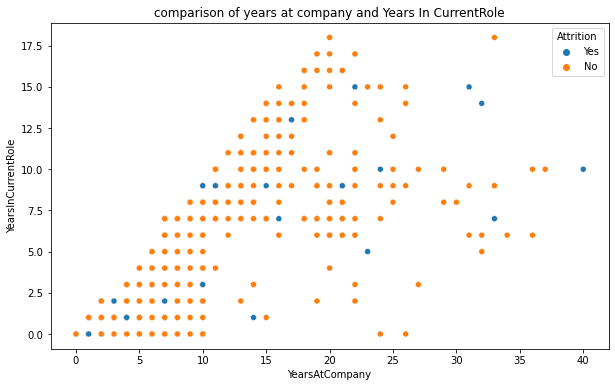

In [47]:
plt.figure(figsize=[10,6])
plt.title('comparison of years at company and Years In CurrentRole')
sns.scatterplot(df['YearsAtCompany'],df['YearsInCurrentRole'],hue=df['Attrition'])

there is alinear relation withyears with company and YearsInCurrentRole

<AxesSubplot:title={'center':'comparison of years at company and Years with crrnt manager'}, xlabel='YearsAtCompany', ylabel='YearsWithCurrManager'>

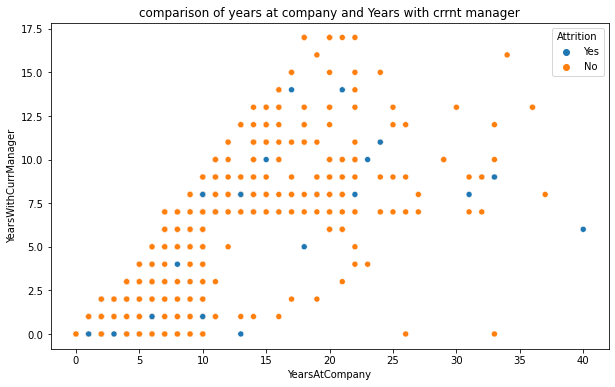

In [48]:
plt.figure(figsize=[10,6])
plt.title('comparison of years at company and Years with crrnt manager')
sns.scatterplot(df['YearsAtCompany'],df['YearsWithCurrManager'],hue=df['Attrition'])

In [49]:
both YearsWithCurrManager and years at company have relation between each other

SyntaxError: invalid syntax (<ipython-input-49-a3c45666c269>, line 1)

<AxesSubplot:title={'center':'comparison of job invilement and monthly income'}, xlabel='JobInvolvement', ylabel='MonthlyIncome'>

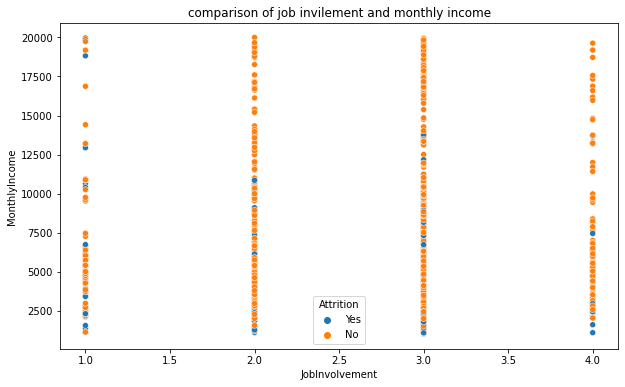

In [50]:
plt.figure(figsize=[10,6])
plt.title('comparison of job invilement and monthly income')
sns.scatterplot(df['JobInvolvement'],df['MonthlyIncome'],hue=df['Attrition'])

job involvement and monthly income are not relating there is no particulr relationship

joblevel and monthly income are highly related in a linear way,,and attrition level also less in high income area

<AxesSubplot:title={'center':'comparison of joblevel and Gender'}, xlabel='JobLevel', ylabel='Gender'>

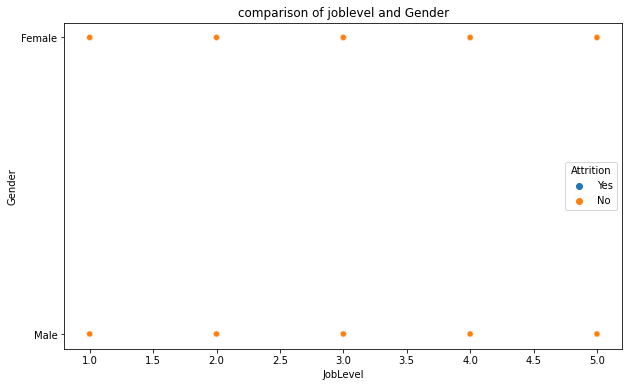

In [51]:
plt.figure(figsize=[10,6])
plt.title('comparison of joblevel and Gender')
sns.scatterplot(df['JobLevel'],df['Gender'],hue=df['Attrition'])

from the plot it shows that both gender playing every role in industry

<AxesSubplot:title={'center':'comparison of Age and jobsatisfaction'}, xlabel='Age', ylabel='JobSatisfaction'>

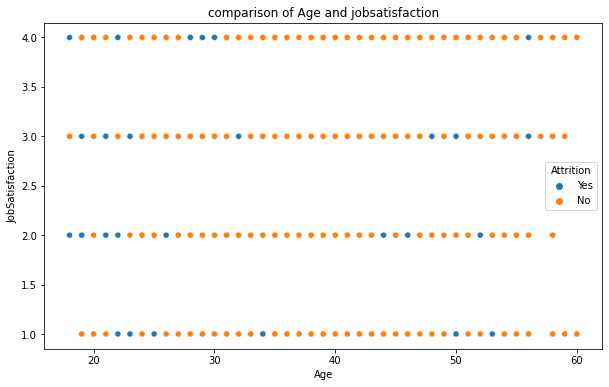

In [52]:
plt.figure(figsize=[10,6])
plt.title('comparison of Age and jobsatisfaction')
sns.scatterplot(df['Age'],df['JobSatisfaction'],hue=df['Attrition'])

job satisfaction not depending the age ang,,attrition is present in high satisfaction level also

<AxesSubplot:title={'center':'comparison of Age marital status'}, xlabel='Age', ylabel='MaritalStatus'>

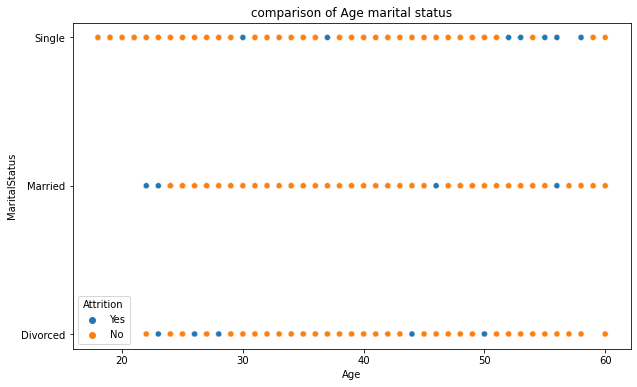

In [53]:
plt.figure(figsize=[10,6])
plt.title('comparison of Age marital status')
sns.scatterplot(df['Age'],df['MaritalStatus'],hue=df['Attrition'])

attrition is more in single category,and youngsters are also in single level of marital status

<AxesSubplot:title={'center':'comparison of years in current role  and monthly income'}, xlabel='YearsInCurrentRole', ylabel='MonthlyIncome'>

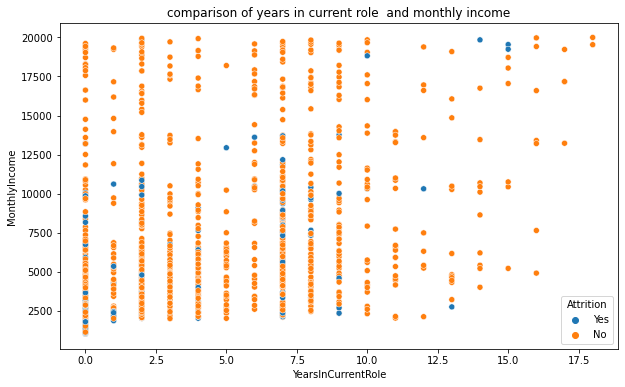

In [54]:
plt.figure(figsize=[10,6])
plt.title('comparison of years in current role  and monthly income')
sns.scatterplot(df['YearsInCurrentRole'],df['MonthlyIncome'],hue=df['Attrition'])

monthly income has some what dependency in yearsof current role,however attrrition is less in higher years,but number of people is less with higheryears of crrent role

<AxesSubplot:title={'center':'comparison  monthly income and jobrole'}, xlabel='MonthlyIncome', ylabel='JobRole'>

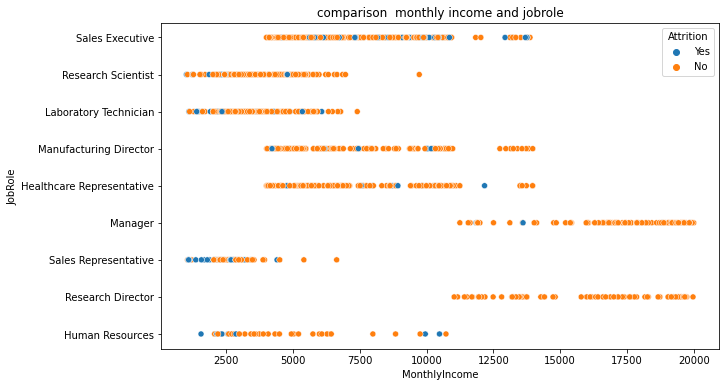

In [55]:
plt.figure(figsize=[10,6])
plt.title('comparison  monthly income and jobrole')
sns.scatterplot(df['MonthlyIncome'],df['JobRole'],hue=df['Attrition'])

IN MANAGER AND RESEARCH DIRECTOR ROLE THERE IS HIGH SALARY ASWELLAS LOW ATTRITION,
BUT IN SALES REPRESENTATIVE JOB ROLE ATTRITION IS HIGH WITH LESS SALARY,SO SURELY INCOME AND ROLE DEPENDING ATTRITION

<AxesSubplot:title={'center':'comparison of MONTHLY INCOME  and DEPMT'}, xlabel='MonthlyIncome', ylabel='Department'>

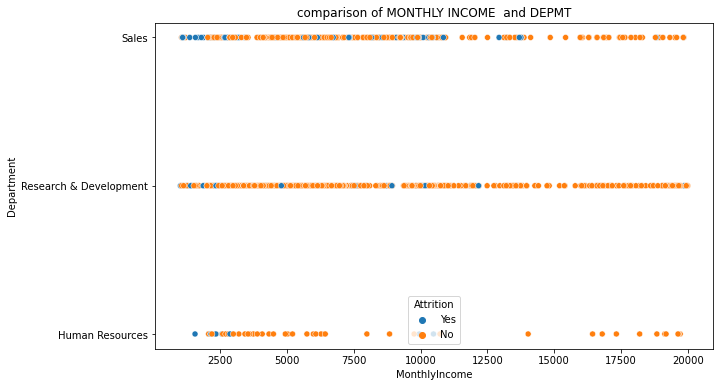

In [56]:
plt.figure(figsize=[10,6])
plt.title('comparison of MONTHLY INCOME  and DEPMT')
sns.scatterplot(df['MonthlyIncome'],df['Department'],hue=df['Attrition'])

NUMBER OF PEOPLE GETTING GOOD INCOME IS LEAST IN HR DEPT, BUT IN R AND D DEPARTMENT  
MORE PEOPLE GETTING HIGH SALARY  THAN SALES,,ANYWAYS IN HIGH MONTHLY INCOME LEVEL THERE IS NO ATTRITION.

<AxesSubplot:title={'center':'comparison of years in current role  and monthly income'}, xlabel='Department', ylabel='TotalWorkingYears'>

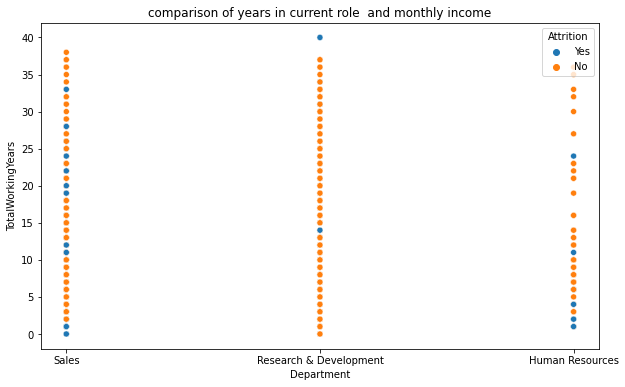

In [57]:
plt.figure(figsize=[10,6])
plt.title('comparison of years in current role  and monthly income')
sns.scatterplot(df['Department'],df['TotalWorkingYears'],hue=df['Attrition'])

in sales and R and D Dptmt there is a consistancy in total working years but it is not there in HR dept,
and clearley attrition is less in R&D

BY ANALYSING THE COLUMNS DROPPING SOME UNWANTED,ORDINAL  AND SINGLE VALUED COLUMNS FROM THE DATASET MANUALLY

In [58]:
df.drop(['Over18'],axis=1,inplace=True)
df.drop(['StandardHours'],axis=1,inplace=True)
df.drop(['EmployeeNumber'],axis=1,inplace=True)
df.drop(['EmployeeCount'],axis=1,inplace=True)

# multivariate analysis

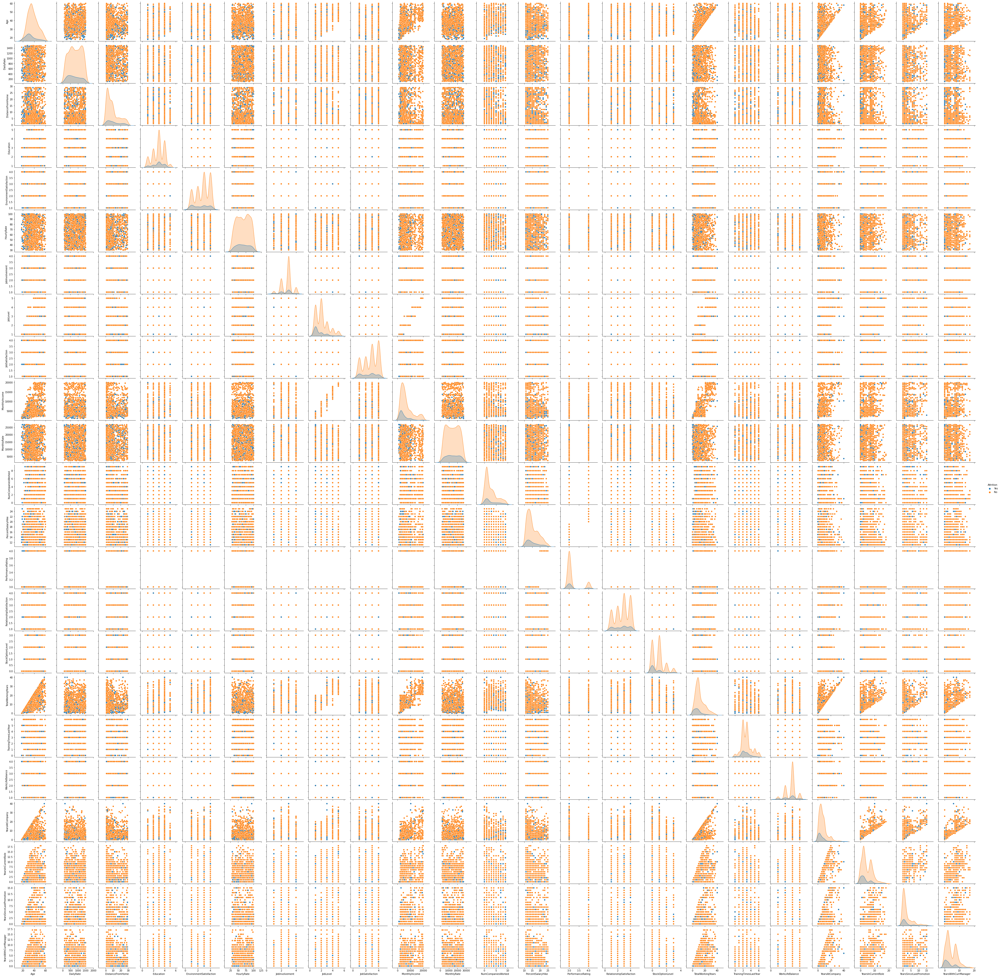

In [59]:
sns.pairplot(df,hue="Attrition")

PAIR PLOT SHOWS THE COMPARISION OF ALL COLUMNS PRESENT IN THE DATA,AND IT SHOWS THE RELATIONSHIPS.

# PLOTTING BOX PLOT FOR CHECKING OUTLIERS

<AxesSubplot:xlabel='Age'>

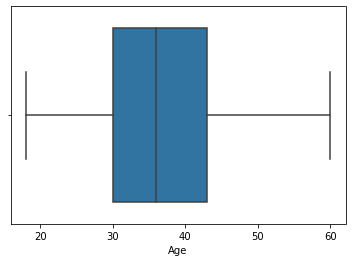

In [60]:
sns.boxplot(df['Age'])

age column values have no outlier presence

<AxesSubplot:xlabel='DailyRate'>

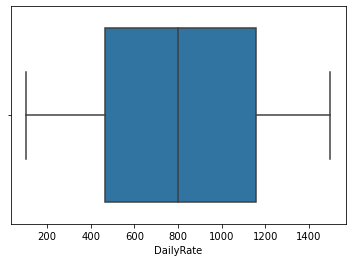

In [61]:
sns.boxplot(df['DailyRate'])

values in daily rate have no outlier presence

<AxesSubplot:xlabel='DistanceFromHome'>

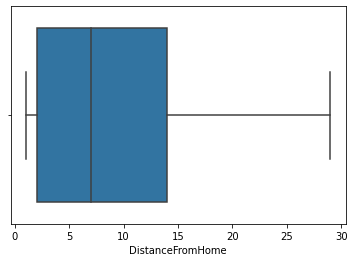

In [62]:
sns.boxplot(df['DistanceFromHome'])

values of distance from home have no outlier presence

<AxesSubplot:xlabel='Education'>

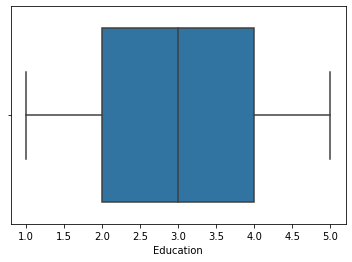

In [63]:
sns.boxplot(df['Education'])

Education values have no outlier presence

<AxesSubplot:xlabel='EnvironmentSatisfaction'>

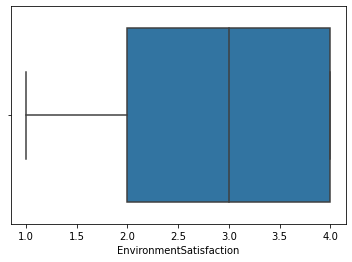

In [64]:
sns.boxplot(df['EnvironmentSatisfaction'])

values in environment satisfaction column have no outlier presence

<AxesSubplot:xlabel='HourlyRate'>

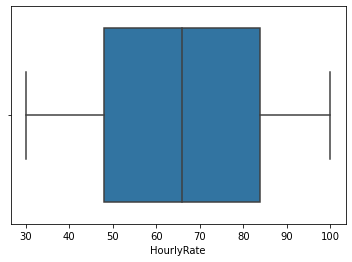

In [65]:
sns.boxplot(df['HourlyRate'])

The values in hourley rate have no outlier presence

<AxesSubplot:xlabel='JobInvolvement'>

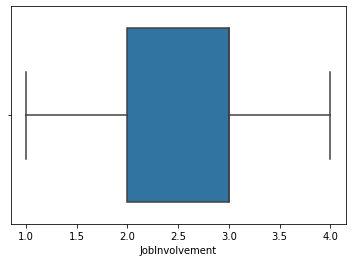

In [66]:
sns.boxplot(df['JobInvolvement'])

values have no outlier presence in the column jobinvilvement

<AxesSubplot:xlabel='JobLevel'>

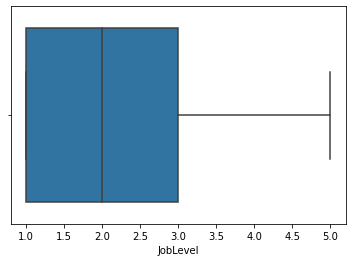

In [67]:
sns.boxplot(df['JobLevel'])

joblevel values have no outlier presence

<AxesSubplot:xlabel='JobSatisfaction'>

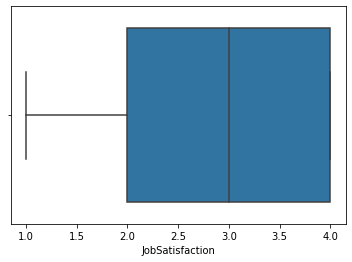

In [68]:
sns.boxplot(df['JobSatisfaction'])

values in jobsatisfaction have no outlier presence

<AxesSubplot:xlabel='MonthlyIncome'>

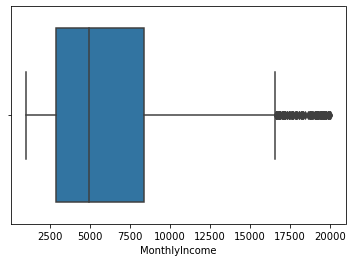

In [69]:
sns.boxplot(df['MonthlyIncome'])

monthlyincome has outliers,it is clear in the plot

<AxesSubplot:xlabel='MonthlyRate'>

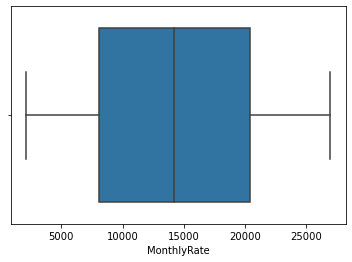

In [70]:
sns.boxplot(df['MonthlyRate'])

monthlyrate has no outlier in plot

<AxesSubplot:xlabel='NumCompaniesWorked'>

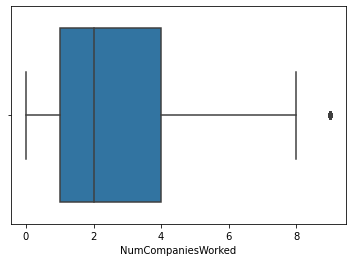

In [71]:
sns.boxplot(df['NumCompaniesWorked'])

outlier presence is there in number of worked companies

<AxesSubplot:xlabel='PercentSalaryHike'>

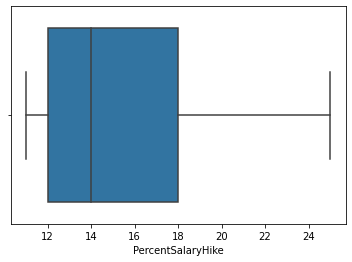

In [72]:
sns.boxplot(df['PercentSalaryHike'])

presentsalaryhike has no outlier values

<AxesSubplot:xlabel='StockOptionLevel'>

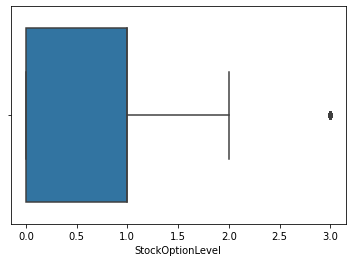

In [73]:
sns.boxplot(df['StockOptionLevel'])

StockOptionLevel has outlier presence

<AxesSubplot:xlabel='TotalWorkingYears'>

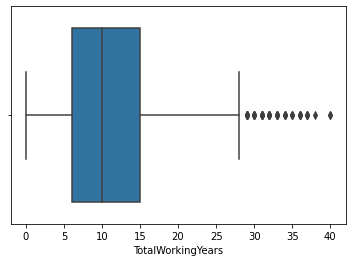

In [74]:
sns.boxplot(df['TotalWorkingYears'])

lot os outliers are there in total working years

<AxesSubplot:xlabel='TrainingTimesLastYear'>

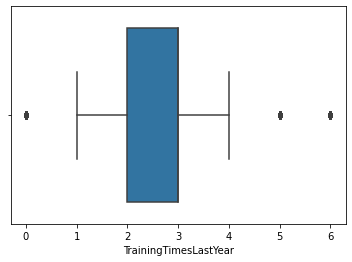

In [75]:
sns.boxplot(df['TrainingTimesLastYear'])

TrainingTimesLastYear has outliers

<AxesSubplot:xlabel='WorkLifeBalance'>

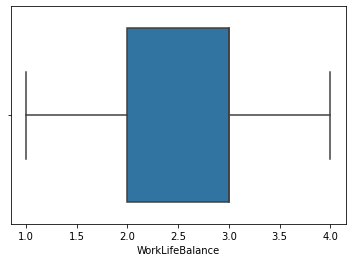

In [76]:
sns.boxplot(df['WorkLifeBalance'])

no outlier is present in worklife balance

<AxesSubplot:xlabel='YearsAtCompany'>

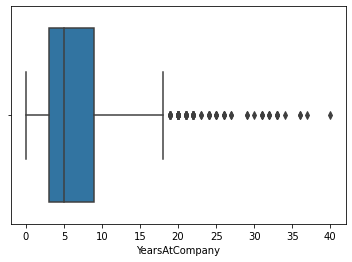

In [77]:
sns.boxplot(df['YearsAtCompany'])

years at company has many outliers

<AxesSubplot:xlabel='YearsInCurrentRole'>

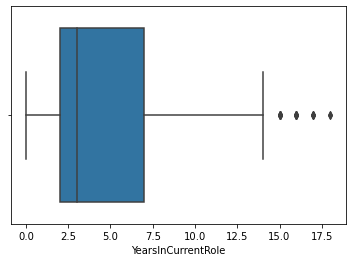

In [78]:
sns.boxplot(df['YearsInCurrentRole'])

years in current role also has outliers

<AxesSubplot:xlabel='YearsSinceLastPromotion'>

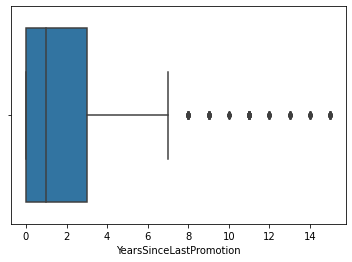

In [79]:
sns.boxplot(df['YearsSinceLastPromotion'])

YearsSinceLastPromotion also has outlier presence

<AxesSubplot:xlabel='YearsWithCurrManager'>

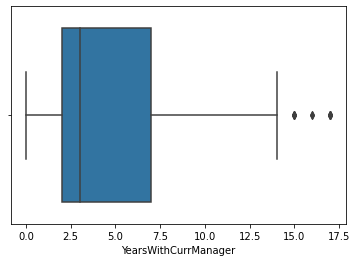

In [80]:
sns.boxplot(df['YearsWithCurrManager'])

years with current manager also has outlier presence

# DATA PREPROCESSING

In [81]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


SPREAD:IN SOME COLUMNS LIKE DailyRate,HourlyRate,MonthlyIncome THE STANDARD DEVIATION IS HEIGH 
THAT MEANS DATA HAS HIGH SPREAD.
SKEWNESS:THE COLUMNS CONTAINING MEAN>MEDIAN LIKE AGE,DAILY RATE,MONTHLY INCOME,
TOTAL WORKING YEARS,YEARS AT COMPANY,YEARS IN CURRENT ROLE SO SKEWNESS MAY PRESENT THERE.
OUTLIER:YERS AT OMPANY,YEARSIN CURRENT ROLE,YEARS SINCE LAST PROMOTION ETC HAS HUGE DIGFERENCE IN 75% AND MAX VALUE
    SO OUTLIER IS THERE

FIRST WE HAVE TO ENCODE THE DATA

# ENCODING

In [82]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StockOptionLevel             int64
TotalWorkingYears            int64
TrainingTimesLastYear        int64
WorkLifeBalance              int64
YearsAtCompany               int64
YearsInCurrentRole  

SOME COLUMNS LIKE Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime 
ARE IN OBJECT DATATYPE.SO WE NEED TO ENCODE IT

In [83]:
from sklearn.preprocessing import OrdinalEncoder
enc=OrdinalEncoder()

In [84]:
for i in df.columns:
    if df[i].dtypes=="object":
        df[i]=enc.fit_transform(df[i].values.reshape(-1,1))

In [85]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1.0,2.0,1102,2.0,1,2,1.0,2,0.0,...,3,1,0,8,0,1,6,4,0,5
1,49,0.0,1.0,279,1.0,8,1,1.0,3,1.0,...,4,4,1,10,3,3,10,7,1,7
2,37,1.0,2.0,1373,1.0,2,2,4.0,4,1.0,...,3,2,0,7,3,3,0,0,0,0
3,33,0.0,1.0,1392,1.0,3,4,1.0,4,0.0,...,3,3,0,8,3,3,8,7,3,0
4,27,0.0,2.0,591,1.0,2,1,3.0,1,1.0,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0.0,1.0,884,1.0,23,2,3.0,3,1.0,...,3,3,1,17,3,3,5,2,0,3
1466,39,0.0,2.0,613,1.0,6,1,3.0,4,1.0,...,3,1,1,9,5,3,7,7,1,7
1467,27,0.0,2.0,155,1.0,4,3,1.0,2,1.0,...,4,2,1,6,0,3,6,2,0,3
1468,49,0.0,1.0,1023,2.0,2,3,3.0,4,1.0,...,3,4,0,17,3,2,9,6,0,8


ALL OBJECT COLUMNS ARE ENCODED SUCCESSFULLY

# TREATING OUTLIERS

FROM BOXPLOT ANALYSIS IT IS CLEAR THAT SOME COLUMNS HAVE OUTLIER PRESENCE

In [86]:
df.shape

(1470, 31)

In [87]:
from scipy.stats import zscore

In [88]:
z=np.abs(zscore(df))

In [89]:
new_df=df[(z<3).all(axis=1)]

In [90]:
new_df.shape

(1387, 31)

83/1470=GIVES NEARLY 6%LOSS,,SO CAN PROCEED IT

# CORRELATION AND HEATMAP

In [91]:
cor=new_df.corr()

In [92]:
cor

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159366,0.022340,0.021946,-0.038242,-0.011265,0.198502,-0.032676,0.014098,-0.039430,...,-0.000617,0.041744,0.054506,0.636136,-0.019008,-0.016913,0.177620,0.121508,0.103632,0.121747
Attrition,-0.159366,1.000000,-0.001041,-0.057220,0.063637,0.081788,-0.032703,0.023585,-0.112393,0.036252,...,0.010781,-0.052344,-0.136676,-0.185619,-0.057285,-0.062492,-0.166455,-0.171015,-0.029263,-0.162297
BusinessTravel,0.022340,-0.001041,1.000000,-0.004606,-0.003521,-0.032873,-0.010560,0.022576,0.001183,-0.025364,...,-0.018274,-0.029660,-0.015159,0.029818,0.010322,-0.014140,-0.027164,-0.029257,-0.027283,-0.044321
DailyRate,0.021946,-0.057220,-0.004606,1.000000,-0.005398,-0.008171,-0.018442,0.040645,0.033123,-0.005242,...,0.000574,0.004516,0.048361,0.046173,0.005861,-0.044266,-0.003580,0.022899,-0.043870,-0.011516
Department,-0.038242,0.063637,-0.003521,-0.005398,1.000000,0.023919,0.012846,0.013432,-0.014540,-0.030618,...,-0.039364,-0.037705,-0.003424,-0.016246,0.036092,0.026978,0.032583,0.065536,0.048931,0.034216
DistanceFromHome,-0.011265,0.081788,-0.032873,-0.008171,0.023919,1.000000,0.001084,0.005882,-0.019279,-0.000819,...,0.023678,0.007885,0.049976,-0.001092,-0.034386,-0.034398,0.011579,0.019039,0.006635,-0.000221
Education,0.198502,-0.032703,-0.010560,-0.018442,0.012846,0.001084,1.000000,-0.038017,-0.026223,-0.019166,...,-0.023487,-0.002393,0.028494,0.125613,-0.026879,0.007844,0.033313,0.058007,0.042517,0.031210
EducationField,-0.032676,0.023585,0.022576,0.040645,0.013432,0.005882,-0.038017,1.000000,0.047924,0.010676,...,-0.003621,-0.013734,-0.015355,-0.012375,0.050502,0.034038,-0.012950,-0.010614,0.034094,0.013437
EnvironmentSatisfaction,0.014098,-0.112393,0.001183,0.033123,-0.014540,-0.019279,-0.026223,0.047924,1.000000,-0.015715,...,-0.025299,0.018414,0.013330,-0.001669,-0.019318,0.032492,0.006621,0.038837,0.027943,0.001606
Gender,-0.039430,0.036252,-0.025364,-0.005242,-0.030618,-0.000819,-0.019166,0.010676,-0.015715,1.000000,...,-0.010757,0.041458,0.026438,-0.058555,-0.040211,0.000134,-0.045123,-0.025536,-0.028162,-0.036280


<AxesSubplot:>

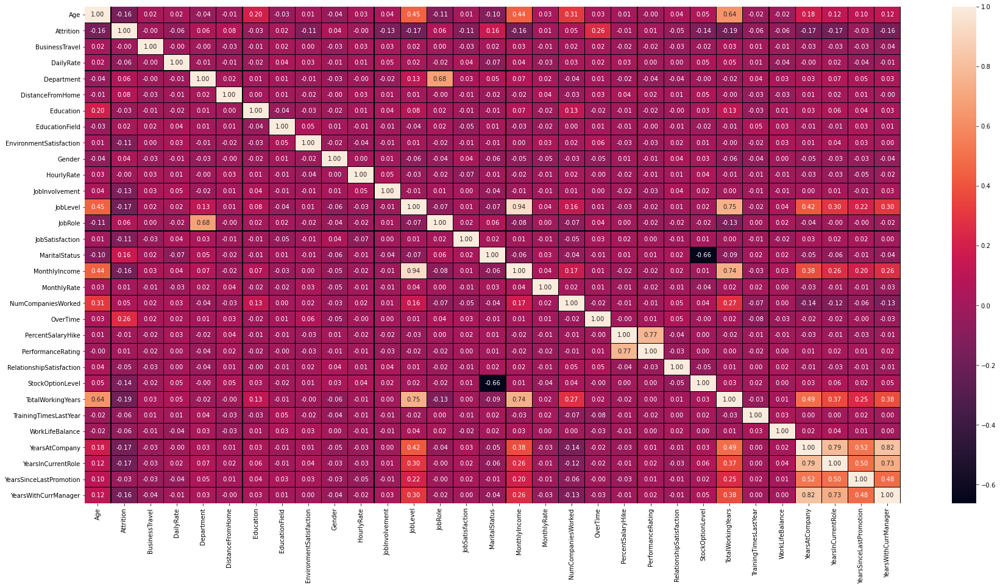

In [93]:
plt.figure(figsize=(30,15))
sns.heatmap(cor,annot=True,linewidths=0.1,linecolor="black",fmt="0.2f")

by analysing heatmap manually dropping some column having column correlation

In [94]:
df.drop(['YearsInCurrentRole'],axis=1,inplace=True)

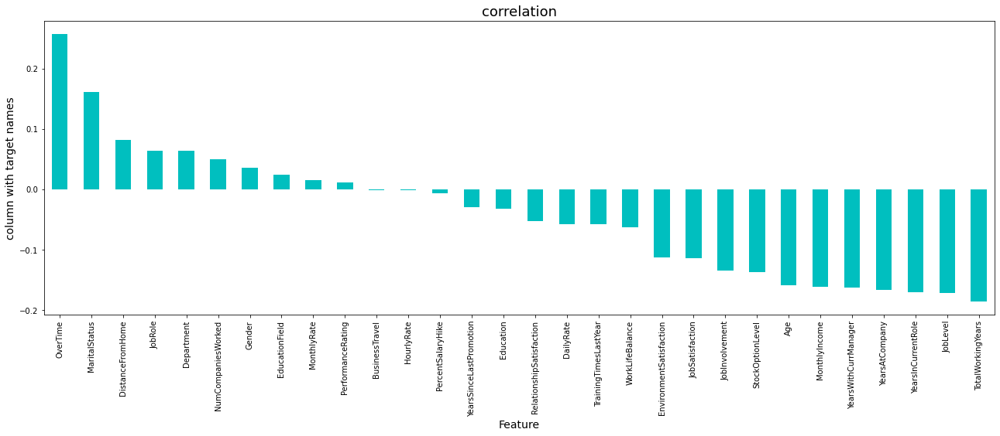

In [95]:
plt.figure(figsize=(22,7))
cor['Attrition'].sort_values(ascending=False).drop(['Attrition']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

figure showing different correlation to target

# SKEWNESS REMOVAL

In [96]:
new_df.skew()

Age                         0.472280
Attrition                   1.805983
BusinessTravel             -1.426774
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.954752
Education                  -0.289024
EducationField              0.544868
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
OverTime                    0.954751
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
Y

SOME COLUMNS HAS HIGH SKEWNESS , SO WE WANT TO TREAT IT,COLUMN HISTOGRAM WILL SHOW THIS

<AxesSubplot:ylabel='Frequency'>

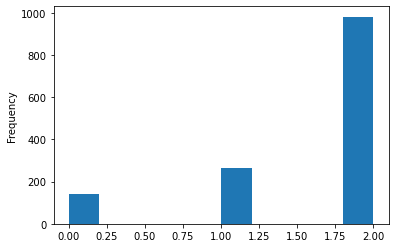

In [97]:
new_df['BusinessTravel'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

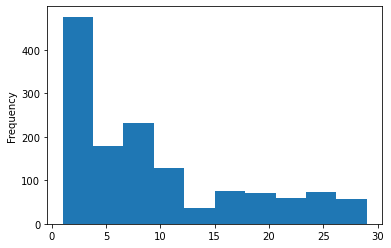

In [98]:
new_df['DistanceFromHome'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

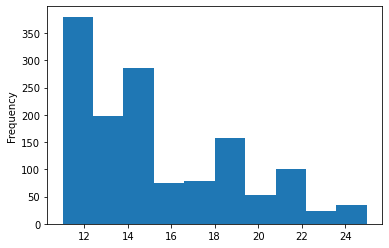

In [99]:
new_df['PercentSalaryHike'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

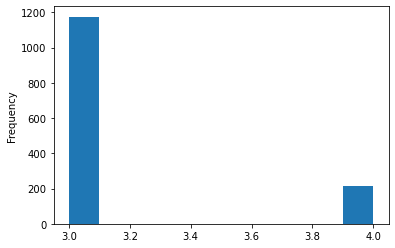

In [100]:
new_df['PerformanceRating'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

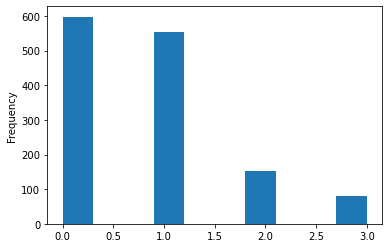

In [101]:
new_df['StockOptionLevel'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

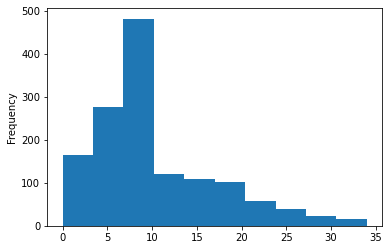

In [102]:
new_df['TotalWorkingYears'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

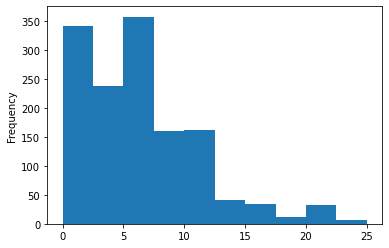

In [103]:
new_df['YearsAtCompany'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

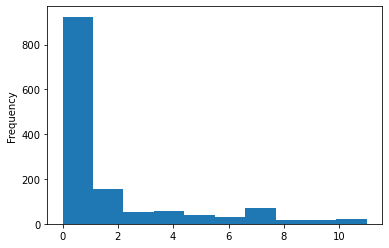

In [104]:
new_df['YearsSinceLastPromotion'].plot.hist()

# SPLITTING X AND Y AND APPLYING POWER TRANSFORMER TO AVOID SKEWNESS

In [105]:
from sklearn.preprocessing import PowerTransformer

In [106]:
x=new_df.drop("Attrition",axis=1)
y=new_df["Attrition"]

In [107]:
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,2.0,1102,2.0,1,2,1.0,2,0.0,94,...,3,1,0,8,0,1,6,4,0,5
1,49,1.0,279,1.0,8,1,1.0,3,1.0,61,...,4,4,1,10,3,3,10,7,1,7
2,37,2.0,1373,1.0,2,2,4.0,4,1.0,92,...,3,2,0,7,3,3,0,0,0,0
3,33,1.0,1392,1.0,3,4,1.0,4,0.0,56,...,3,3,0,8,3,3,8,7,3,0
4,27,2.0,591,1.0,2,1,3.0,1,1.0,40,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,1.0,884,1.0,23,2,3.0,3,1.0,41,...,3,3,1,17,3,3,5,2,0,3
1466,39,2.0,613,1.0,6,1,3.0,4,1.0,42,...,3,1,1,9,5,3,7,7,1,7
1467,27,2.0,155,1.0,4,3,1.0,2,1.0,87,...,4,2,1,6,0,3,6,2,0,3
1468,49,1.0,1023,2.0,2,3,3.0,4,1.0,63,...,3,4,0,17,3,2,9,6,0,8


In [108]:
x.shape

(1387, 30)

In [109]:
y

0       1.0
1       0.0
2       1.0
3       0.0
4       0.0
       ... 
1465    0.0
1466    0.0
1467    0.0
1468    0.0
1469    0.0
Name: Attrition, Length: 1387, dtype: float64

In [110]:
y.shape

(1387,)

In [111]:
pt=PowerTransformer(method="yeo-johnson")

In [112]:
X_power=pt.fit_transform(x)

In [113]:
df1=pd.DataFrame(X_power,columns=x.columns)

In [114]:
df1.skew()

Age                        -0.004079
BusinessTravel             -0.960583
DailyRate                  -0.199742
Department                  0.015095
DistanceFromHome           -0.008149
Education                  -0.103747
EducationField             -0.008642
EnvironmentSatisfaction    -0.205472
Gender                     -0.417296
HourlyRate                 -0.105678
JobInvolvement             -0.018801
JobLevel                    0.110769
JobRole                    -0.337641
JobSatisfaction            -0.217730
MaritalStatus              -0.158253
MonthlyIncome               0.027700
MonthlyRate                -0.176560
NumCompaniesWorked          0.016175
OverTime                    0.954751
PercentSalaryHike           0.112128
PerformanceRating           0.000000
RelationshipSatisfaction   -0.191406
StockOptionLevel            0.089929
TotalWorkingYears          -0.009666
TrainingTimesLastYear       0.057949
WorkLifeBalance            -0.011133
YearsAtCompany             -0.025230
Y

BusinessTravel has high skewness and it is already not an important coplimn so dropping it

In [115]:
df1.drop(['BusinessTravel'],axis=1,inplace=True)

again checking with histogram

<AxesSubplot:ylabel='Frequency'>

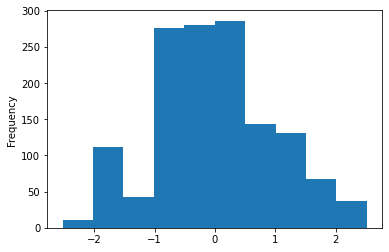

In [116]:
df1['TotalWorkingYears'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

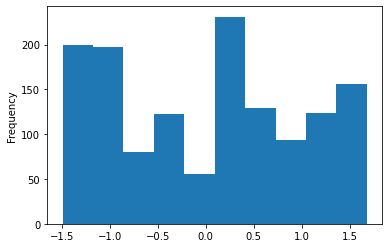

In [117]:
df1['DistanceFromHome'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

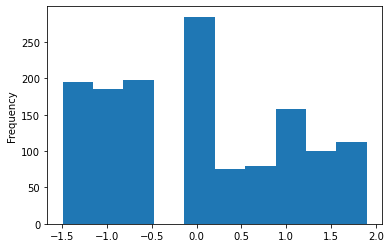

In [118]:
df1['PercentSalaryHike'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

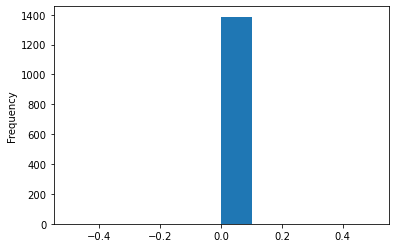

In [119]:
df1['PerformanceRating'].plot.hist()

In [120]:
df1.skew()

Age                        -0.004079
DailyRate                  -0.199742
Department                  0.015095
DistanceFromHome           -0.008149
Education                  -0.103747
EducationField             -0.008642
EnvironmentSatisfaction    -0.205472
Gender                     -0.417296
HourlyRate                 -0.105678
JobInvolvement             -0.018801
JobLevel                    0.110769
JobRole                    -0.337641
JobSatisfaction            -0.217730
MaritalStatus              -0.158253
MonthlyIncome               0.027700
MonthlyRate                -0.176560
NumCompaniesWorked          0.016175
OverTime                    0.954751
PercentSalaryHike           0.112128
PerformanceRating           0.000000
RelationshipSatisfaction   -0.191406
StockOptionLevel            0.089929
TotalWorkingYears          -0.009666
TrainingTimesLastYear       0.057949
WorkLifeBalance            -0.011133
YearsAtCompany             -0.025230
YearsInCurrentRole         -0.069631
Y

skewness completely removed

# SAMPLING TARGET

from the EDA portion it is clear that our target-quality has unequal classes,the different wine quality numbers are 
not in equal number,so here we want to apply sampling technique to make it equal

HERE PREFERING SMOTE OR OVERSAMPLING

In [121]:
from imblearn.over_sampling import SMOTE

In [122]:
sm=SMOTE()

In [123]:
x1,y1=sm.fit_resample(x,y)

In [124]:
y1

0       1.0
1       0.0
2       1.0
3       0.0
4       0.0
       ... 
2311    1.0
2312    1.0
2313    1.0
2314    1.0
2315    1.0
Name: Attrition, Length: 2316, dtype: float64

In [125]:
y1.value_counts()

0.0    1158
1.0    1158
Name: Attrition, dtype: int64

it perfectly sampled

# MULTICOLLINEARITY

USING VIF FOR CHECKING MULTICOLLINEARITY

In [126]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [127]:
def vif_calc():
    vif=pd.DataFrame()
    vif['VIF Factor']=[variance_inflation_factor(x1.values,i)for i in range(x1.shape[1])]
    vif['Features']=x1.columns
    print(vif)

In [128]:
vif_calc()

    VIF Factor                  Features
0    31.243031                       Age
1     8.294336            BusinessTravel
2     5.351435                 DailyRate
3    16.901027                Department
4     2.697999          DistanceFromHome
5     9.455675                 Education
6     4.376546            EducationField
7     6.658919   EnvironmentSatisfaction
8     2.903315                    Gender
9    13.037051                HourlyRate
10   14.014536            JobInvolvement
11   42.239832                  JobLevel
12   10.660312                   JobRole
13    6.752583           JobSatisfaction
14    7.144138             MaritalStatus
15   25.517247             MonthlyIncome
16    5.361898               MonthlyRate
17    2.861751        NumCompaniesWorked
18    1.854397                  OverTime
19   36.051970         PercentSalaryHike
20  110.689903         PerformanceRating
21    7.135132  RelationshipSatisfaction
22    2.849931          StockOptionLevel
23   12.303360  

In [129]:
df1.drop(['PerformanceRating','Age','JobLevel'],axis=1,inplace=True)

# SCALING FEATURES

In [130]:
from sklearn.preprocessing import StandardScaler

In [131]:
sc=StandardScaler()

In [132]:
x1=sc.fit_transform(x1)

In [133]:
x1

array([[ 0.72163755,  0.65205468,  0.87070274, ...,  0.26029316,
        -0.67657186,  0.61189182],
       [ 1.65156525, -1.0431157 , -1.30410358, ...,  1.25453002,
        -0.24407381,  1.2711807 ],
       [ 0.2566737 ,  0.65205468,  1.58682973, ..., -1.06535599,
        -0.67657186, -1.03633039],
       ...,
       [ 0.37291466,  0.65205468,  0.3395532 , ...,  0.59170544,
        -0.67657186, -1.03633039],
       [ 0.95411947,  0.63630745,  0.43732699, ..., -0.40253142,
        -0.24407381, -0.37704151],
       [-0.78949497,  0.19531858, -0.69367799, ..., -1.06535599,
        -0.67657186, -1.03633039]])

# SPLITTING AND APPLYING ALGORITHMS

WE ALREADY CREATED X AND Y (x1,y1) for sampling purpose

In [134]:
from sklearn.model_selection import train_test_split

In [135]:
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=.30,random_state=15)

In [136]:
x_train.shape

(1621, 30)

In [137]:
x_test.shape

(695, 30)

In [138]:
y_train.shape

(1621,)

In [139]:
y_test.shape

(695,)

# LOGISTIC REGRESSION

In [140]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report

In [141]:
lg=LogisticRegression()

In [142]:
lg.fit(x_train,y_train)

LogisticRegression()

In [143]:
pred=lg.predict(x_test)

In [144]:
print(pred)

[0. 1. 0. 1. 0. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0.
 1. 0. 0. 1. 1. 1. 0. 1. 1. 1. 0. 0. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1.
 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0.
 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1. 0. 1. 1. 0. 1.
 0. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 0. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0.
 0. 0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 0. 0. 0. 1. 1. 1. 0. 1. 0.
 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 0. 1. 1. 0. 0. 1. 1. 0. 0. 1. 0. 1. 1. 1.
 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 0. 1. 0. 1. 1. 1. 0.
 0. 1. 1. 0. 1. 0. 0. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0.
 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 0. 0. 1. 1. 0.
 0. 1. 1. 0. 0. 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0.
 0. 1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1. 1.
 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 0. 1. 0.

# ACCURACY SCORE,CONFUSION MATRIX,CLASSIFICATION REPORT

In [145]:
print("Accuracy score:",accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))      

Accuracy score: 0.8618705035971223
[[292  52]
 [ 44 307]]
              precision    recall  f1-score   support

         0.0       0.87      0.85      0.86       344
         1.0       0.86      0.87      0.86       351

    accuracy                           0.86       695
   macro avg       0.86      0.86      0.86       695
weighted avg       0.86      0.86      0.86       695



# AUC-ROC CURVE

In [146]:
from sklearn.metrics import roc_curve

In [147]:
from sklearn.metrics import roc_auc_score

In [148]:
y_pred_prob=lg.predict_proba(x_test)[:,1]

In [149]:
y_pred_prob

array([2.71738943e-01, 9.38662353e-01, 1.15376676e-01, 9.70813400e-01,
       3.14330794e-01, 9.78140288e-01, 5.59131124e-01, 9.60323425e-01,
       2.06938404e-01, 1.12457156e-03, 6.39140560e-02, 9.59113854e-01,
       8.30697920e-01, 9.15316809e-01, 9.91519806e-01, 7.72654153e-01,
       5.35053033e-01, 9.71450130e-01, 6.61768578e-01, 9.57520654e-01,
       1.42126761e-02, 8.67217731e-01, 9.89605222e-01, 1.28028044e-01,
       7.87941824e-01, 3.29931946e-02, 2.32481306e-02, 9.73464153e-01,
       5.03148555e-01, 7.75588321e-01, 1.15886144e-02, 6.56324315e-01,
       9.44994584e-01, 7.77506697e-01, 4.97612257e-01, 2.46340436e-02,
       9.91594941e-01, 4.64368505e-01, 4.89346505e-02, 6.94196392e-01,
       9.53702435e-01, 8.88290165e-01, 9.78069231e-01, 6.70124157e-02,
       9.19966707e-02, 1.31750257e-01, 7.91879708e-01, 6.50288078e-01,
       7.89326818e-04, 3.58219057e-02, 7.69992543e-02, 9.81960470e-02,
       7.19710940e-04, 9.77308037e-01, 4.38696522e-01, 1.83086696e-01,
      

In [150]:
fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)

In [151]:
fpr

array([0.        , 0.        , 0.        , 0.00290698, 0.00290698,
       0.00581395, 0.00581395, 0.00872093, 0.00872093, 0.01162791,
       0.01162791, 0.01453488, 0.01453488, 0.01744186, 0.01744186,
       0.02034884, 0.02034884, 0.02325581, 0.02325581, 0.02616279,
       0.02616279, 0.03197674, 0.03197674, 0.03488372, 0.03488372,
       0.0377907 , 0.0377907 , 0.04069767, 0.04069767, 0.04360465,
       0.04360465, 0.0494186 , 0.0494186 , 0.05523256, 0.05523256,
       0.06104651, 0.06104651, 0.06686047, 0.06686047, 0.06976744,
       0.06976744, 0.07267442, 0.07267442, 0.0755814 , 0.0755814 ,
       0.07848837, 0.07848837, 0.08139535, 0.08139535, 0.0872093 ,
       0.0872093 , 0.09593023, 0.09593023, 0.09883721, 0.09883721,
       0.10174419, 0.10174419, 0.10465116, 0.10465116, 0.11046512,
       0.11046512, 0.11918605, 0.11918605, 0.125     , 0.125     ,
       0.12790698, 0.12790698, 0.13372093, 0.13372093, 0.13662791,
       0.13662791, 0.13953488, 0.13953488, 0.14244186, 0.14244

In [152]:
tpr

array([0.        , 0.002849  , 0.05982906, 0.05982906, 0.15099715,
       0.15099715, 0.23931624, 0.23931624, 0.2962963 , 0.2962963 ,
       0.32763533, 0.32763533, 0.42165242, 0.42165242, 0.43019943,
       0.43019943, 0.45014245, 0.45014245, 0.48433048, 0.48433048,
       0.56980057, 0.56980057, 0.5982906 , 0.5982906 , 0.60968661,
       0.60968661, 0.62962963, 0.62962963, 0.68091168, 0.68091168,
       0.70940171, 0.70940171, 0.71225071, 0.71225071, 0.72079772,
       0.72079772, 0.72649573, 0.72649573, 0.73504274, 0.73504274,
       0.74928775, 0.74928775, 0.75498575, 0.75498575, 0.75783476,
       0.75783476, 0.76638177, 0.76638177, 0.76923077, 0.76923077,
       0.77777778, 0.77777778, 0.79202279, 0.79202279, 0.79487179,
       0.79487179, 0.8034188 , 0.8034188 , 0.81481481, 0.81481481,
       0.81766382, 0.81766382, 0.82621083, 0.82621083, 0.83190883,
       0.83190883, 0.83760684, 0.83760684, 0.84045584, 0.84045584,
       0.84330484, 0.84330484, 0.84615385, 0.84615385, 0.85754

In [153]:
thresholds

array([1.99866478e+00, 9.98664784e-01, 9.90972473e-01, 9.90810211e-01,
       9.79739201e-01, 9.79262884e-01, 9.69389481e-01, 9.69346479e-01,
       9.60129143e-01, 9.60111423e-01, 9.53702435e-01, 9.53435556e-01,
       9.27865866e-01, 9.27016035e-01, 9.25665811e-01, 9.24927623e-01,
       9.22809621e-01, 9.22751491e-01, 9.14089434e-01, 9.12681699e-01,
       8.86134042e-01, 8.74417267e-01, 8.60956522e-01, 8.60521977e-01,
       8.46629547e-01, 8.43972822e-01, 8.23084131e-01, 8.22313075e-01,
       7.97423943e-01, 7.97268835e-01, 7.77506697e-01, 7.74402237e-01,
       7.73890445e-01, 7.71512443e-01, 7.61682213e-01, 7.60490853e-01,
       7.55837841e-01, 7.51517989e-01, 7.47153064e-01, 7.46491622e-01,
       7.31765050e-01, 7.30686366e-01, 7.19519480e-01, 7.16843265e-01,
       7.10406464e-01, 7.05865551e-01, 6.96644823e-01, 6.96620405e-01,
       6.94196392e-01, 6.88733560e-01, 6.86518097e-01, 6.75496501e-01,
       6.56488012e-01, 6.56324315e-01, 6.50288078e-01, 6.48359903e-01,
      

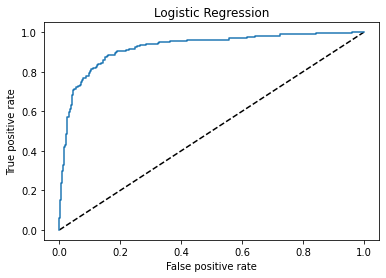

In [154]:
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label="Logistic Regression")
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.title("Logistic Regression")
plt.show()

# DECISION TREE CLASSSIFIER

In [155]:
from sklearn.tree import DecisionTreeClassifier

In [156]:
dtc=DecisionTreeClassifier()

In [157]:
dtc.fit(x_train,y_train)

DecisionTreeClassifier()

In [158]:
dtc.score(x_train,y_train)

1.0

In [159]:
preddtc=dtc.predict(x_test)

In [160]:
print(preddtc)

[0. 1. 0. 1. 0. 1. 0. 1. 0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0.
 1. 0. 0. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1.
 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0.
 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 1. 1. 0. 1.
 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0.
 0. 0. 1. 0. 1. 0. 1. 1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1. 0. 1. 0.
 0. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 1. 0. 0. 1. 1. 0. 0. 1. 0. 1. 1. 1.
 1. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 1. 1. 0.
 1. 1. 1. 0. 1. 0. 1. 1. 1. 0. 1. 0. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1.
 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 0. 0. 1. 1. 0. 0. 0. 1. 1. 0. 1. 0.
 1. 1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 1. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 0. 1. 1.

In [161]:
accdtc=classification_report(y_test,preddtc)

In [162]:
print(accdtc)

              precision    recall  f1-score   support

         0.0       0.88      0.85      0.86       344
         1.0       0.86      0.89      0.87       351

    accuracy                           0.87       695
   macro avg       0.87      0.87      0.87       695
weighted avg       0.87      0.87      0.87       695



In [163]:
print(confusion_matrix(y_test,preddtc))
print(classification_report(y_test,preddtc)) 

[[292  52]
 [ 40 311]]
              precision    recall  f1-score   support

         0.0       0.88      0.85      0.86       344
         1.0       0.86      0.89      0.87       351

    accuracy                           0.87       695
   macro avg       0.87      0.87      0.87       695
weighted avg       0.87      0.87      0.87       695



In [164]:
y_pred_prob=dtc.predict_proba(x_test)[:,1]

In [165]:
y_pred_prob

array([0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 1., 1., 1., 0., 1.,
       1., 1., 1., 0., 1., 1., 0., 1., 0., 0., 1., 1., 0., 0., 1., 0., 1.,
       1., 1., 1., 1., 0., 1., 1., 1., 1., 0., 0., 0., 1., 1., 0., 0., 0.,
       0., 0., 1., 1., 1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0.,
       0., 1., 0., 0., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 1., 1., 1., 0., 0., 0., 1., 1., 0., 1., 0., 1., 1., 0., 1., 1.,
       1., 1., 0., 1., 1., 0., 1., 1., 1., 0., 0., 1., 1., 0., 1., 0., 0.,
       0., 0., 0., 1., 0., 1., 0., 1., 1., 0., 1., 1., 0., 0., 0., 1., 0.,
       0., 1., 1., 1., 1., 0., 1., 0., 0., 1., 0., 0., 0., 1., 0., 1., 1.,
       1., 0., 0., 1., 0., 0., 1., 1., 0., 0., 1., 0., 1., 1., 1., 1., 0.,
       0., 0., 0., 1., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0., 0., 0., 1.,
       0., 1., 1., 1., 0., 1., 1., 1., 0., 1., 0., 1., 1., 1., 0., 1., 0.,
       1., 1., 0., 1., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 1., 1.,
       1., 0., 0., 1., 0.

In [166]:
fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)

In [167]:
fpr

array([0.        , 0.15116279, 1.        ])

In [168]:
tpr

array([0.        , 0.88603989, 1.        ])

In [169]:
thresholds

array([2., 1., 0.])

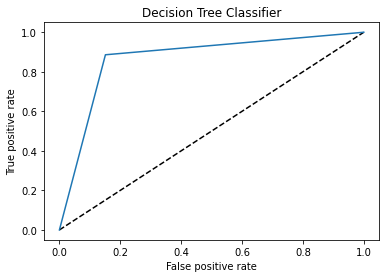

In [170]:
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label="Decision Tree Classifier")
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.title("Decision Tree Classifier")
plt.show()

# K-NEAREST NEIGHBOR

In [171]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()

In [172]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [173]:
predknn=knn.predict(x_test)

In [174]:
print(predknn)

[0. 1. 0. 1. 0. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0.
 1. 0. 0. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1.
 0. 0. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0.
 1. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 0. 1. 0. 1. 1. 1. 0. 1. 0. 1. 1. 0. 1.
 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0.
 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0.
 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1. 0. 1. 1. 1.
 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 0. 0. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 0.
 0. 1. 1. 0. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 1.
 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 0. 0. 0. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0.
 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0.
 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 0. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 0. 1. 1.

In [175]:
accknn=classification_report(y_test,predknn)

In [176]:
print(accknn)

              precision    recall  f1-score   support

         0.0       0.98      0.74      0.84       344
         1.0       0.79      0.99      0.88       351

    accuracy                           0.86       695
   macro avg       0.89      0.86      0.86       695
weighted avg       0.89      0.86      0.86       695



In [177]:
print(confusion_matrix(y_test,predknn))
print(classification_report(y_test,predknn)) 

[[254  90]
 [  5 346]]
              precision    recall  f1-score   support

         0.0       0.98      0.74      0.84       344
         1.0       0.79      0.99      0.88       351

    accuracy                           0.86       695
   macro avg       0.89      0.86      0.86       695
weighted avg       0.89      0.86      0.86       695



In [178]:
y_pred_prob=knn.predict_proba(x_test)[:,1]

In [179]:
y_pred_prob

array([0.2, 1. , 0.4, 1. , 0.2, 1. , 0.8, 1. , 0.2, 0.2, 0.2, 1. , 1. ,
       1. , 1. , 0.6, 1. , 1. , 1. , 1. , 0.4, 1. , 1. , 0.2, 1. , 0. ,
       0. , 1. , 1. , 0.8, 0. , 0.2, 1. , 1. , 0.4, 1. , 1. , 0.6, 0. ,
       1. , 1. , 0.6, 1. , 0.6, 0.2, 0.4, 0.8, 0.8, 0. , 0. , 0.6, 0.6,
       0. , 1. , 1. , 0.2, 1. , 1. , 0.8, 1. , 1. , 0.2, 0.4, 1. , 0.2,
       1. , 1. , 0. , 0. , 1. , 0.4, 0.2, 1. , 1. , 1. , 1. , 0.6, 0. ,
       0. , 0. , 0.4, 0.8, 0.8, 0.4, 1. , 0. , 0.6, 1. , 1. , 0. , 0.6,
       0.4, 0.6, 1. , 0. , 1. , 0. , 1. , 1. , 0. , 0.8, 1. , 1. , 1. ,
       0.6, 1. , 1. , 0. , 1. , 0. , 1. , 0. , 0.4, 1. , 0.8, 0.4, 1. ,
       0.4, 0.2, 0. , 0. , 0. , 1. , 0. , 1. , 0.8, 1. , 1. , 0.6, 1. ,
       1. , 0.2, 1. , 0.6, 1. , 0. , 0.4, 0.6, 1. , 1. , 0.8, 0.8, 1. ,
       0.2, 0.4, 1. , 0.8, 0.2, 0. , 1. , 0.2, 1. , 0. , 1. , 0.6, 1. ,
       1. , 0.8, 0. , 1. , 1. , 0. , 0. , 1. , 0. , 1. , 1. , 1. , 1. ,
       0.6, 0.6, 0.4, 0.2, 1. , 1. , 1. , 1. , 0.2, 1. , 0. , 0.

In [180]:
fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)

In [181]:
fpr

array([0.        , 0.02906977, 0.13662791, 0.26162791, 0.44476744,
       0.7122093 , 1.        ])

In [182]:
tpr

array([0.        , 0.81481481, 0.93447293, 0.98575499, 1.        ,
       1.        , 1.        ])

In [183]:
thresholds

array([2. , 1. , 0.8, 0.6, 0.4, 0.2, 0. ])

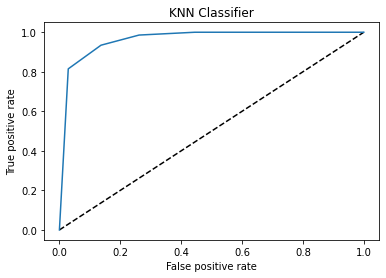

In [184]:
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label="KNN Classifier")
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.title("KNN Classifier")
plt.show()

# SUPPORT VECTOR

In [185]:
from sklearn.svm import SVC

In [186]:
svc=SVC(probability=True)

In [187]:
svc.fit(x_train,y_train)

SVC(probability=True)

In [188]:
predsvc=svc.predict(x_test)

In [189]:
print(predsvc)

[0. 1. 0. 1. 0. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0.
 1. 0. 0. 1. 1. 1. 0. 0. 1. 1. 0. 0. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1.
 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0.
 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 0. 1. 1. 0. 1.
 0. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 0. 1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0.
 0. 0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0.
 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 0. 1. 1. 1. 0. 1. 1. 0. 0. 1. 0. 1. 1. 1.
 1. 0. 1. 0. 0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0.
 0. 1. 1. 0. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1.
 0. 0. 0. 0. 1. 0. 1. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0.
 0. 0. 1. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 0. 0. 0. 1. 1. 1. 1. 0.
 0. 1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 0. 0. 1. 0.

In [190]:
accsvc=classification_report(y_test,predsvc)

In [191]:
print(accsvc)

              precision    recall  f1-score   support

         0.0       0.90      0.92      0.91       344
         1.0       0.92      0.90      0.91       351

    accuracy                           0.91       695
   macro avg       0.91      0.91      0.91       695
weighted avg       0.91      0.91      0.91       695



In [192]:
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

[[318  26]
 [ 35 316]]
              precision    recall  f1-score   support

         0.0       0.90      0.92      0.91       344
         1.0       0.92      0.90      0.91       351

    accuracy                           0.91       695
   macro avg       0.91      0.91      0.91       695
weighted avg       0.91      0.91      0.91       695



In [193]:
y_pred_prob=svc.predict_proba(x_test)[:,1]

In [194]:
 y_pred_prob

array([1.12255018e-01, 9.90626593e-01, 7.11543770e-02, 9.93546620e-01,
       8.33975785e-02, 9.97283114e-01, 8.27257553e-01, 9.46699334e-01,
       9.50126603e-03, 3.89403883e-02, 2.33746013e-03, 9.99982184e-01,
       9.78158444e-01, 9.93784452e-01, 9.92350739e-01, 8.68813716e-01,
       4.27352550e-01, 9.99989532e-01, 9.85806357e-01, 9.88581957e-01,
       1.54029118e-02, 9.88516853e-01, 9.99995767e-01, 9.60305002e-02,
       9.63528612e-01, 1.25410423e-02, 7.60738178e-04, 9.97069170e-01,
       9.16396547e-01, 7.48639962e-01, 3.62142973e-02, 3.72229432e-02,
       9.62752022e-01, 9.27873027e-01, 1.48373976e-01, 1.73882861e-01,
       9.99998868e-01, 8.67520235e-01, 1.66614489e-02, 6.51762736e-01,
       9.95796765e-01, 9.25128326e-01, 9.97095054e-01, 3.92006213e-01,
       1.39523603e-02, 4.49078755e-02, 9.55448032e-01, 9.09268136e-01,
       1.56092360e-03, 1.82450941e-02, 5.40180930e-02, 1.80789245e-01,
       4.52651653e-03, 9.95021687e-01, 6.93299173e-01, 8.74024976e-02,
      

In [195]:
fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)

In [196]:
fpr

array([0.        , 0.        , 0.        , 0.00290698, 0.00290698,
       0.00581395, 0.00581395, 0.00872093, 0.00872093, 0.01162791,
       0.01162791, 0.01453488, 0.01453488, 0.01744186, 0.01744186,
       0.02325581, 0.02325581, 0.02616279, 0.02616279, 0.03488372,
       0.03488372, 0.04069767, 0.04069767, 0.04360465, 0.04360465,
       0.0494186 , 0.0494186 , 0.05232558, 0.05232558, 0.05523256,
       0.05523256, 0.05813953, 0.05813953, 0.06104651, 0.06104651,
       0.06395349, 0.06395349, 0.06686047, 0.06686047, 0.0755814 ,
       0.0755814 , 0.07848837, 0.0872093 , 0.0872093 , 0.10174419,
       0.10174419, 0.10465116, 0.10465116, 0.11627907, 0.11627907,
       0.125     , 0.125     , 0.13662791, 0.13662791, 0.14534884,
       0.14534884, 0.15988372, 0.15988372, 0.1744186 , 0.1744186 ,
       0.17732558, 0.17732558, 0.18313953, 0.18313953, 0.2005814 ,
       0.2005814 , 0.22093023, 0.22093023, 0.22383721, 0.22383721,
       0.24127907, 0.24127907, 0.26162791, 0.26162791, 0.27034

In [197]:
tpr

array([0.        , 0.002849  , 0.73504274, 0.73504274, 0.74074074,
       0.74074074, 0.75783476, 0.75783476, 0.76923077, 0.76923077,
       0.77492877, 0.77492877, 0.78347578, 0.78347578, 0.78632479,
       0.78632479, 0.78917379, 0.78917379, 0.81766382, 0.81766382,
       0.82336182, 0.82336182, 0.82905983, 0.82905983, 0.83190883,
       0.83190883, 0.83760684, 0.83760684, 0.84615385, 0.84615385,
       0.86039886, 0.86039886, 0.86324786, 0.86324786, 0.86894587,
       0.86894587, 0.88034188, 0.88034188, 0.88888889, 0.88888889,
       0.9002849 , 0.9002849 , 0.9031339 , 0.90598291, 0.90598291,
       0.91737892, 0.91737892, 0.92022792, 0.92022792, 0.92307692,
       0.92307692, 0.92877493, 0.92877493, 0.93162393, 0.93162393,
       0.93447293, 0.93447293, 0.93732194, 0.93732194, 0.94017094,
       0.94017094, 0.94301994, 0.94301994, 0.94586895, 0.94586895,
       0.94871795, 0.94871795, 0.95441595, 0.95441595, 0.96296296,
       0.96296296, 0.96581197, 0.96581197, 0.96866097, 0.96866

In [198]:
thresholds

array([1.99999999e+00, 9.99999989e-01, 9.20710273e-01, 9.19798660e-01,
       9.16396547e-01, 9.15868681e-01, 9.06345475e-01, 9.03838431e-01,
       8.97552208e-01, 8.96988108e-01, 8.93753374e-01, 8.90480896e-01,
       8.76371055e-01, 8.74935737e-01, 8.70890910e-01, 8.68813716e-01,
       8.68151912e-01, 8.67707803e-01, 8.45220927e-01, 8.29551281e-01,
       8.11771139e-01, 8.04288309e-01, 7.96950406e-01, 7.88216426e-01,
       7.81552102e-01, 7.67284391e-01, 7.58686599e-01, 7.48639962e-01,
       7.23588799e-01, 7.14972120e-01, 6.93299173e-01, 6.76644919e-01,
       6.51762736e-01, 6.48475354e-01, 6.37374299e-01, 6.35627597e-01,
       6.18575667e-01, 6.12984952e-01, 5.95825314e-01, 5.76020297e-01,
       5.34559005e-01, 5.14744085e-01, 5.00000000e-01, 4.83662949e-01,
       4.56002405e-01, 4.09914531e-01, 3.92006213e-01, 3.91494317e-01,
       3.66930631e-01, 3.65890767e-01, 3.59660245e-01, 3.40533353e-01,
       3.34114174e-01, 3.30306422e-01, 2.89263476e-01, 2.88726078e-01,
      

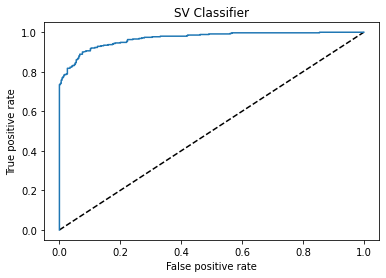

In [199]:
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label="Support Vector Classifier")
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.title("SV Classifier")
plt.show()

# RANDOMFOREST

In [200]:
from sklearn.ensemble import RandomForestClassifier

In [201]:
rfc=RandomForestClassifier()

In [202]:
rfc.fit(x_train,y_train)

RandomForestClassifier()

In [203]:
predrfc=rfc.predict(x_test)

In [204]:
print(predrfc)

[0. 1. 0. 1. 0. 1. 0. 1. 0. 0. 0. 1. 1. 1. 1. 0. 0. 1. 1. 1. 0. 1. 1. 0.
 1. 0. 0. 1. 1. 0. 0. 0. 1. 1. 0. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1.
 0. 0. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0.
 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 1. 0. 1.
 0. 1. 1. 0. 0. 1. 1. 1. 0. 0. 1. 0. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0.
 0. 0. 1. 0. 1. 0. 1. 1. 0. 1. 1. 0. 1. 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0.
 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 0. 1. 0. 1. 0. 1. 1. 0. 0. 1. 0. 1. 1. 1.
 1. 0. 0. 0. 0. 1. 1. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1. 1. 0. 0.
 0. 1. 1. 0. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1. 1. 0. 1.
 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 0. 1. 0.
 0. 0. 1. 0. 0. 0. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 0.
 0. 1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 1. 0. 0. 1. 1.

In [205]:
accrfc=classification_report(y_test,predrfc)

In [206]:
print(accrfc)

              precision    recall  f1-score   support

         0.0       0.91      0.97      0.94       344
         1.0       0.97      0.90      0.94       351

    accuracy                           0.94       695
   macro avg       0.94      0.94      0.94       695
weighted avg       0.94      0.94      0.94       695



In [207]:
print(confusion_matrix(y_test,predrfc))
print(classification_report(y_test,predrfc))

[[335   9]
 [ 34 317]]
              precision    recall  f1-score   support

         0.0       0.91      0.97      0.94       344
         1.0       0.97      0.90      0.94       351

    accuracy                           0.94       695
   macro avg       0.94      0.94      0.94       695
weighted avg       0.94      0.94      0.94       695



In [208]:
y_pred_prob=rfc.predict_proba(x_test)[:,1]

In [209]:
y_pred_prob

array([0.31, 0.96, 0.18, 0.91, 0.21, 0.96, 0.41, 0.73, 0.15, 0.11, 0.07,
       0.98, 0.82, 0.96, 0.93, 0.44, 0.37, 0.98, 0.93, 0.93, 0.09, 0.99,
       0.89, 0.24, 0.97, 0.06, 0.01, 0.99, 0.88, 0.41, 0.21, 0.23, 0.75,
       0.93, 0.41, 0.8 , 1.  , 0.89, 0.1 , 0.78, 0.91, 0.57, 0.93, 0.11,
       0.19, 0.14, 0.93, 0.8 , 0.02, 0.08, 0.25, 0.08, 0.06, 0.98, 0.86,
       0.21, 0.95, 0.96, 0.22, 0.96, 0.83, 0.12, 0.08, 0.94, 0.14, 0.89,
       0.77, 0.18, 0.27, 0.94, 0.29, 0.03, 0.99, 0.87, 0.66, 0.96, 0.32,
       0.12, 0.27, 0.11, 0.28, 0.4 , 0.16, 0.29, 0.97, 0.07, 0.82, 0.86,
       1.  , 0.06, 0.33, 0.09, 0.4 , 0.99, 0.11, 0.93, 0.18, 0.99, 0.98,
       0.15, 0.2 , 0.75, 0.94, 0.78, 0.41, 0.42, 0.67, 0.  , 0.82, 0.22,
       1.  , 0.08, 0.24, 1.  , 0.88, 0.06, 0.96, 0.11, 0.06, 0.1 , 0.22,
       0.1 , 0.89, 0.05, 0.97, 0.47, 0.83, 0.98, 0.13, 0.96, 1.  , 0.05,
       0.94, 0.17, 0.76, 0.09, 0.16, 0.3 , 0.96, 0.8 , 0.71, 0.61, 0.94,
       0.11, 0.18, 0.96, 0.57, 0.13, 0.29, 0.94, 0.

In [210]:
fpr,tpr,thresholds=roc_curve(y_test,y_pred_prob)

In [211]:
fpr

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00581395, 0.00581395, 0.00872093, 0.00872093, 0.00872093,
       0.01162791, 0.01162791, 0.01162791, 0.01453488, 0.01744186,
       0.02034884, 0.02034884, 0.02325581, 0.02616279, 0.03197674,
       0.0377907 , 0.04069767, 0.04651163, 0.06976744, 0.07848837,
       0.08430233, 0.09883721, 0.11046512, 0.11337209, 0.11627907,
       0.125     , 0.14244186, 0.15406977, 0.16860465, 0.1744186 ,
       0.19476744, 0.22093023, 0.25290698, 0.27325581, 0.29069767,
       0.2994186 , 0.31104651, 0.33430233, 0.36337209, 0.39534884,
       0.42151163, 0.44767442, 0.46511628, 0.49127907, 0.52034

In [212]:
tpr

array([0.        , 0.03988604, 0.10826211, 0.17948718, 0.24216524,
       0.30769231, 0.34472934, 0.4017094 , 0.44159544, 0.49287749,
       0.50997151, 0.54131054, 0.58689459, 0.61823362, 0.63817664,
       0.64387464, 0.65811966, 0.69230769, 0.7008547 , 0.72364672,
       0.73219373, 0.74358974, 0.74928775, 0.76068376, 0.77777778,
       0.78347578, 0.7977208 , 0.80626781, 0.81196581, 0.81481481,
       0.81481481, 0.82051282, 0.83475783, 0.84045584, 0.84900285,
       0.86039886, 0.86609687, 0.87179487, 0.88319088, 0.88319088,
       0.88888889, 0.89173789, 0.9002849 , 0.9031339 , 0.9031339 ,
       0.90883191, 0.91168091, 0.91168091, 0.91737892, 0.91737892,
       0.92307692, 0.93447293, 0.94301994, 0.94586895, 0.94586895,
       0.95156695, 0.95156695, 0.95156695, 0.95726496, 0.95726496,
       0.96011396, 0.96581197, 0.96866097, 0.96866097, 0.96866097,
       0.96866097, 0.96866097, 0.97435897, 0.97720798, 0.98005698,
       0.98005698, 0.98575499, 0.98575499, 0.98575499, 0.98860

In [213]:
thresholds

array([2.  , 1.  , 0.99, 0.98, 0.97, 0.96, 0.95, 0.94, 0.93, 0.91, 0.9 ,
       0.89, 0.87, 0.86, 0.85, 0.84, 0.83, 0.82, 0.81, 0.8 , 0.79, 0.78,
       0.77, 0.76, 0.75, 0.74, 0.73, 0.72, 0.71, 0.7 , 0.69, 0.67, 0.66,
       0.65, 0.62, 0.61, 0.59, 0.58, 0.57, 0.55, 0.54, 0.53, 0.52, 0.51,
       0.5 , 0.48, 0.47, 0.46, 0.44, 0.43, 0.42, 0.41, 0.4 , 0.39, 0.38,
       0.37, 0.35, 0.34, 0.33, 0.32, 0.31, 0.3 , 0.29, 0.28, 0.27, 0.26,
       0.25, 0.24, 0.23, 0.22, 0.21, 0.2 , 0.19, 0.18, 0.17, 0.16, 0.15,
       0.14, 0.13, 0.12, 0.11, 0.1 , 0.09, 0.08, 0.07, 0.06, 0.05, 0.04,
       0.03, 0.02, 0.01, 0.  ])

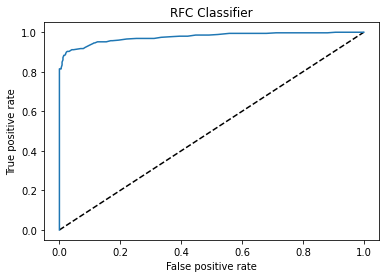

In [214]:
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label="Random Forest Classifier")
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.title("RFC Classifier")
plt.show()

WE GOT DIFFERENT ACCURACY SCORES LOGISTIC REGRESSION:84,,DECISIONTREE:86,,KNN:86,,,SVC:92 ,,RFC:94
HERE to select a particular algorithm we need to analyse cross validation mean score
    

# CROSS VALIDATION MEAN SCORE

In [215]:
from sklearn.model_selection import cross_val_score

In [216]:
print(cross_val_score(lg,x1,y1,cv=5).mean())

0.8433166381172266


In [217]:
print(cross_val_score(dtc,x1,y1,cv=5).mean())

0.8528384970581664


In [218]:
print(cross_val_score(knn,x1,y1,cv=5).mean())

0.8398125046548


In [219]:
print(cross_val_score(svc,x1,y1,cv=5).mean())

0.8942969390035005


In [220]:
print(cross_val_score(rfc,x1,y1,cv=5).mean())

0.919352796603858


BY TAKING LEAST DIFF IN ACCURACY AND CROSS VALIDATION,WE CAN PREFER LOGISTIC REGRESSION

# HYPER PARAMETER TUNING FOR LOGISTIC REGRESSION

In [221]:
from sklearn.model_selection import GridSearchCV

In [222]:
parameter={'C':[0.001,0.01,0.1,1.],
          'penalty':['l1','l2'],
          'tol':[0.001,0.01,0.1,1.],
          'intercept_scaling':[0.01,0.1,1.]}

In [223]:
GCV=GridSearchCV(LogisticRegression(),parameter,cv=5)

In [224]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1.0],
                         'intercept_scaling': [0.01, 0.1, 1.0],
                         'penalty': ['l1', 'l2'],
                         'tol': [0.001, 0.01, 0.1, 1.0]})

In [225]:
GCV.best_params_

{'C': 0.1, 'intercept_scaling': 0.01, 'penalty': 'l2', 'tol': 0.001}

In [226]:
FinalHR_model=LogisticRegression(C = 1.0, intercept_scaling = 0.01, penalty = 'l2', tol = 1.0)

In [227]:
FinalHR_model.fit(x_train,y_train)

LogisticRegression(intercept_scaling=0.01, tol=1.0)

In [228]:
Finalpred=FinalHR_model.predict(x_test)

In [229]:
print(Finalpred)

[0. 1. 0. 1. 0. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0.
 1. 0. 0. 1. 0. 1. 0. 1. 1. 1. 0. 0. 1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 1. 1.
 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0.
 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 1. 0. 1. 1. 0. 1.
 0. 1. 1. 0. 0. 1. 1. 1. 1. 0. 1. 0. 1. 0. 1. 0. 0. 1. 1. 0. 1. 0. 0. 0.
 0. 0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 0. 0. 0. 1. 1. 1. 0. 1. 0.
 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 0. 1. 1. 0. 0. 1. 1. 0. 0. 1. 0. 1. 1. 1.
 1. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 0. 0. 1. 0. 1. 1. 1. 0.
 0. 1. 1. 0. 1. 1. 0. 1. 0. 0. 1. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0.
 0. 1. 1. 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.
 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 0. 1. 1. 0. 0. 1. 1. 0.
 0. 1. 1. 0. 0. 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 0.
 0. 1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1. 1.
 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 0. 1. 1. 0. 1. 0.

In [230]:
Finalacc=accuracy_score(y_test,Finalpred)

In [231]:
print(Finalacc)

0.8589928057553957


model getting accuracy of 85.9%

# conclusion and saving

In [232]:
conclusion=pd.DataFrame([FinalHR_model.predict(x_test)[:],Finalpred[:]],index=["Predicted","Orginal"])

In [233]:
conclusion

,0,1,2,3,4,5,6,7,8,9,...,685,686,687,688,689,690,691,692,693,694
Predicted,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0
Orginal,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0


SAVING

In [234]:
import joblib

In [235]:
joblib.dump(FinalHR_model,"HR_model.pk1")

['HR_model.pk1']